# Rotini

**Background**

We prepare a Hall strip and then watch the free evolution of a quasi-1D interacting BEC under a gauge field with no external scalar potential in the rotating frame.

In [1]:
import sys, os, re, pickle
sys.path.append(os.path.abspath('..'))

import numpy as np
import matplotlib.pyplot as plt
from copy import copy, deepcopy
from tqdm.notebook import tqdm
from scipy.ndimage import rotate as rotate_image
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d
from skimage.filters import gaussian as gaussblur
from scipy.optimize import curve_fit
from PIL import Image
import time
import h5py
import pandas as pd
import warnings
from condensate import Wavefunction, Environment, hbar
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

SMALL_SIZE = 13
MEDIUM_SIZE = 13
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


def gauss(x,x0,a,s): return a*np.exp(- (x-x0) **2 / (2*s**2))

def satexp(t, tau,a): return (3.31+a*np.exp(-t/tau))

def rotate_crop(array, viewx=200, viewy=350, angle=0):
    """ Rotate and crop a 2d array """
    s = np.shape(array)
    rotated = rotate_image(array, angle, reshape=False)
    cropped = rotated[(s[0]-viewy)//2 : (s[0]+viewy)//2 , (s[1]-viewx)//2 : (s[1]+viewx)//2 ]
    return cropped

def find_angle(ncrop):
    xsize = len(ncrop)
    xx = np.linspace(-10, 10, xsize)
    yy = np.linspace(-10, 10, xsize)
    xx, yy = np.meshgrid(xx, yy)

    # Calculate the moment of inertia tensor
    Ixx = np.sum(ncrop*yy*yy)
    Iyy = np.sum(ncrop*xx*xx)
    Ixy = np.sum(ncrop*xx*yy)
    Iyx = Ixy
    I =np.array( [[Ixx, Ixy], [Iyx, Iyy]])
    evals, evecs = np.linalg.eig(I)
    iangle = (180*np.arctan(evecs[np.argmin(evals)][1]/evecs[np.argmin(evals)][0])/np.pi)
    return iangle


## Prepare groundstate

In [2]:
omega   = 2*np.pi*10
epsilon = 0.2
dt = 1e-5
fov = 350e-6
DIM=512

e = Environment(DIM=DIM, fov=fov, N=1e6)
e.harmonic_potential(omega=omega, epsilon=epsilon)


            Running condensate on 512x512 grid with:
            atom number: 1e+06 
            mass:        3.80e-26
        


In [3]:
groundstate = Wavefunction(e)
groundstate.initialize_Psi(width=100)
groundstate.relax(vmax=2e8, dt=dt, steps=4000)

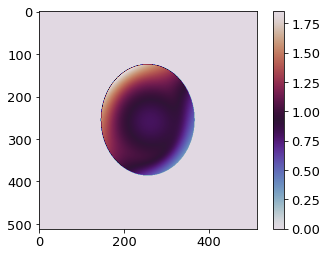

In [4]:
groundstate.show_phase()

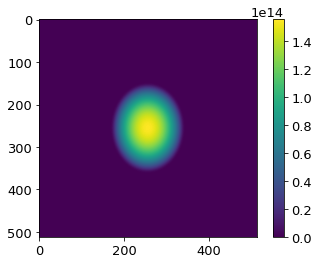

1000000.0


In [5]:
groundstate.show_density()
print(np.round(np.sum(groundstate.density) * ((fov/DIM)**2)))

## Spin up

In [6]:
def rotation_freq_simple(timestep, whirrTime=30000, whirrMax=omega):
    tanh =  omega * 1.002 * np.tanh(3.46 * timestep / whirrTime)
    return np.min([whirrMax,tanh])

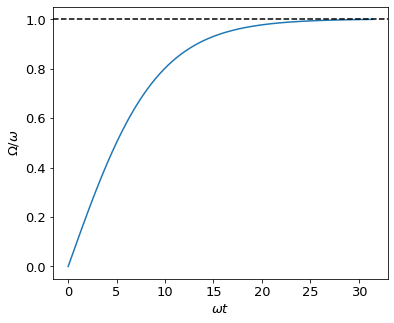

In [7]:
whirrMax = omega
steps = 50000
whirrtime = 50000

times = np.arange(steps)
Omega = [rotation_freq_simple(t, whirrTime=whirrtime) for t in times]

plt.figure(figsize=(6,5))
plt.plot(omega*dt*times, np.array(Omega)/omega)
plt.axhline(Omega[-1]/omega,ls='--',c='k')
plt.xlabel(r'$\omega t$')
plt.ylabel(r'$\Omega/\omega$')
plt.show()

In [8]:
hallstrip = deepcopy(groundstate)

In [9]:
hallenv = hallstrip.env
hallenv.rotating_frame(omegaR=Omega)
hallenv.absorbing_boundaries(strength=1, radius=1*e.fov/2)

hallstrip.evolve(dt=dt, steps=steps, cooling=0.0, showevery=50)

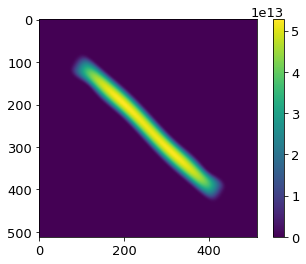

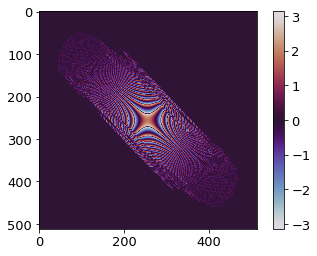

In [10]:
hallstrip.show_density()
hallstrip.show_phase()

In [48]:
startstrip = deepcopy(hallstrip)

In [49]:
steps=8000
startstrip.env.rotating_frame(omegaR=omega*np.ones(steps))
# startstrip.env.harmonic_potential(omega=omega, epsilon=0.05)
startstrip.env.absorbing_boundaries(strength=1, radius=1.1*e.fov/2)
startstrip.evolve(steps=steps, cooling=0.0, dt=5e-5)

## Calibrate starting widths

In [16]:
# Set some processing parameters
viewx = 150
viewy = 150
dx = fov/DIM
mass = 3.8e-26
lb = np.sqrt(hbar / (2*mass *omega))
y  = dx * (np.arange(viewy) - viewy//2)

def gauss(x,x0,a,s): return a*np.exp(- (x-x0) **2 / (2*s**2))

def satexp(t, tau,a): return (3.31+a*np.exp(-t/tau))

def rotate_crop(array, viewx=200, viewy=350, angle=0):
    """ Rotate and crop a 2d array """
    s = np.shape(array)
    rotated = rotate_image(array, angle, reshape=False)
    cropped = rotated[(s[0]-viewy)//2 : (s[0]+viewy)//2 , (s[1]-viewx)//2 : (s[1]+viewx)//2 ]
    return cropped

def find_angle(ncrop):
    xsize = len(ncrop)
    xx = np.linspace(-10, 10, xsize)
    yy = np.linspace(-10, 10, xsize)
    xx, yy = np.meshgrid(xx, yy)

    # Calculate the moment of inertia tensor
    Ixx = np.sum(ncrop*yy*yy)
    Iyy = np.sum(ncrop*xx*xx)
    Ixy = np.sum(ncrop*xx*yy)
    Iyx = Ixy
    I =np.array( [[Ixx, Ixy], [Iyx, Iyy]])
    evals, evecs = np.linalg.eig(I)
    iangle = (180*np.arctan(evecs[np.argmin(evals)][1]/evecs[np.argmin(evals)][0])/np.pi)
    return iangle

def find_width(density, window=200, plot=False):
    cloud = density/1e20
    cloud = rotate_crop(cloud, viewx=window, viewy=window, angle=90+np.real(find_angle(cloud)))
    x  = dx * (np.arange(window) - window//2)
    xprofile = np.sum(cloud, axis=0)
    gaussfit,_ = curve_fit(gauss, x, xprofile, [0, np.max(xprofile), 6e-6])
    if plot: 
        f,a = plt.subplots(ncols=2)
        a[0].imshow(cloud)
        a[1].plot(x,xprofile)
        a[1].plot(x,gauss(x,*gaussfit))
        a[1].set_aspect(1./a[1].get_data_ratio())
        plt.tight_layout()
        plt.show()
    return gaussfit[2]

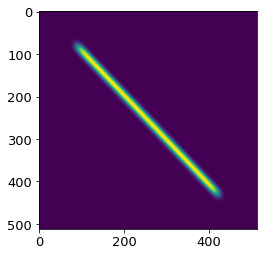

In [29]:
plt.imshow(startstrip.density)

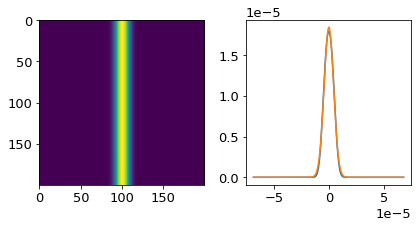

1.3057392669768564


In [50]:
width = find_width(startstrip.density, plot=True)
print(np.sqrt(2) * width / lb)

In [55]:
170*100

17000

In [57]:
# plot the widths for a bunch of times
rlbs = []
steps = 120
frames = 100
times = np.cumsum([0] + [steps] * frames)
startstrip = deepcopy(hallstrip)
width = find_width(startstrip.density, plot=False)
rlbs.append(np.sqrt(2) * width/lb)
for time in tqdm(times[1:]):
    startstrip.env.rotating_frame(omegaR=omega*np.ones(steps))
    startstrip.env.absorbing_boundaries(strength=1, radius=1.1*e.fov/2)
    startstrip.evolve(steps=steps, cooling=0.0, dt=5e-5)
    width = find_width(startstrip.density, plot=False)
    rlbs.append(np.sqrt(2) * width/lb)
    
tosave = np.vstack([times,rlbs])
np.savetxt('data/stripwidths_Date_2020.csv', tosave)

In [22]:
times, rlbs = np.genfromtxt('data/stripwidths_sep16_2020.csv')
smoothed = savgol_filter(rlbs,53,5)
widths_interpolated = interp1d(times,smoothed)

def expfit(t,tau,amp): return 1+amp*np.exp(-t/tau)
f,_ = curve_fit(expfit, times, rlbs, [1e4,2])

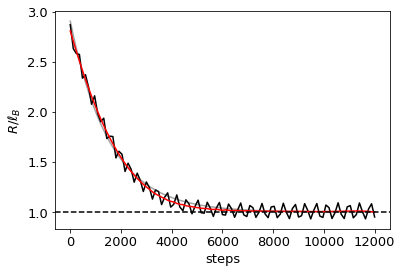

In [23]:
plt.plot(times, np.array(rlbs),'k-')
plt.plot(times, expfit(times, *f), '-', c=[0.1,0.1,0.1,0.4])
plt.plot(times, widths_interpolated(times), 'r')
plt.axhline(1,ls='--', c='k')
plt.xlabel('steps')
plt.ylabel('$R/\ell_B$')
plt.show()

## Make Rotini

In [90]:
rotini = deepcopy(startstrip)
# rotini.env.spoon['type'] = 'mouse'

In [91]:
noise = (0.j)*np.zeros((DIM,DIM))
for i in range(DIM):
    for j in range(DIM):
        noise[i,j]= np.exp(0.2 * 1.j * 2*np.pi * (0.5-np.random.rand()))

rotini.Psi *= noise

In [92]:
steps = 10000
rotini.env.harmonic_potential(omega=omega, epsilon=0.0)
# rotini.env.absorbing_boundaries(strength=1, radius=1*e.fov/2)
rotini.env.rotating_frame(omegaR=[omega]*steps)
rotini.evolve(steps=steps, cooling=0.0, dt=4e-5)

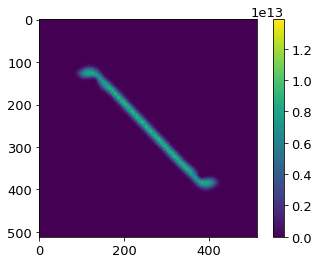

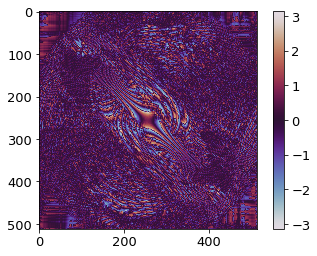

In [34]:
rotini.show_density()
rotini.show_phase()

# Find vortices

In [8]:
# Functions
warnings.simplefilter("ignore")

def phase_vortex_finder(inputPsi,
                        rigidphase=14,
                        blursigma=10,
                        blurthreshold=0.5,
                        returnPhase=False,
                        debug=False):
    '''
    Finds vortices using the phase. Steps:
    1) cancel the xy phase
    2) blur the density to make a blurmask
    3) find points where the curl of the velocity field (dphi) is nonzero, within the blurmask
    '''
    test = inputPsi.copy() / 1e3
    x = np.linspace(-5,5,DIM)
    xx, yy = np.meshgrid(x, x)
    phase = (xx + yy)*(xx- yy)
    test *= np.exp(1j * rigidphase * phase)
    
    blurmask = gaussblur(np.abs(test), sigma=blursigma) > blurthreshold
    
    if debug:
        f,axarr = plt.subplots(figsize=(12,5), ncols=2)
        im = axarr[0].imshow(np.abs(test) * blurmask)
        plt.colorbar(im, ax=axarr[0])
        axarr[1].imshow(np.angle(test) * blurmask, cmap='bwr')
        plt.show()
        
    vorts = np.zeros((DIM,DIM))

    for i in range(DIM-1):
        for j in range(DIM-1):
            if blurmask[i,j]:
                g = np.zeros(4)
                dphi = np.zeros(4)
                g[0] = (test[i,j]     / test[i+1,j])   * (np.abs(test[i+1, j])   / np.abs(test[i,j]))
                g[1] = (test[i+1,j]   / test[i+1,j+1]) * (np.abs(test[i+1, j+1]) / np.abs(test[i+1,j]))
                g[2] = (test[i+1,j+1] / test[i,j+1])   * (np.abs(test[i, j+1])   / np.abs(test[i+1,j+1]))
                g[3] = (test[i,j+1]   / test[i,j])     * (np.abs(test[i, j])     / np.abs(test[i,j+1]))
                for k in range(4):
                    dphi[k] = np.angle(g[k])
                total = sum(dphi)
                vorts[i,j] = total / 2*np.pi
                
    if returnPhase:
        return vorts, np.angle(test) * blurmask
    else:
        return vorts
    
def make_frame(cloud, savefig=None, plot=False):
    '''
    Plot a frame of the movie
    '''
    density = np.abs(cloud)
    smoothRotini = deepcopy(rotini)
    relaxsteps = 10
    smoothRotini.Psi = np.complex128(cloud.copy())
    smoothRotini.env.rotating_frame(omegaR=[omega]*relaxsteps)
    smoothRotini.env.absorbing_boundaries(strength=10, radius=1.2*e.fov/2)
    smoothRotini.relax(steps=relaxsteps,dt=5e-5, vmax=1e8)
    vorts, phase = phase_vortex_finder(smoothRotini.Psi,
                                       blurthreshold=4,
                                       rigidphase=13.6,
                                   debug=False, returnPhase=True)
    f, axarr = plt.subplots(figsize=(10,6), ncols=2)
    axarr[0].imshow(0.3*density/np.max(density) + vorts, vmax=.35,vmin=0.03,cmap='inferno')
    axarr[0].axis('off')
    axarr[1].imshow(phase, cmap='bwr')
    axarr[1].axis('off')
    plt.tight_layout()
    if savefig:
        plt.savefig(savefig, dpi=150)
    if not plot: plt.close()

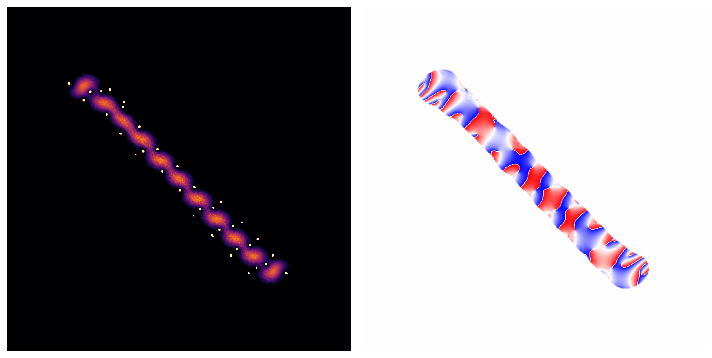

In [209]:
make_frame(rotini.Psi.copy(), plot=True, savefig=f'data/testTracked.jpg')

## Make a rotini movie with vortices

In [46]:
def noiseMaker(amp=0.15):
    noise = (0.j)*np.zeros((DIM,DIM))
    for i in range(DIM):
        for j in range(DIM):
            noise[i,j]= np.exp(amp * 1.j * 2*np.pi * (0.5-np.random.rand()))
    return noise


# generate data        
dt = 4e-5

def compute_rotini(startStrip, runTime=40000, frames=7,
                   dsname='rotini', datafile='data/rotini.hdf5'):
    
    rotini = deepcopy(startStrip)
    rotini.env.harmonic_potential(omega=omega, epsilon=0.0)
    times = [runTime // frames] * frames
    
    with h5py.File(datafile, 'w') as f:
        dset = f.create_dataset(dsname, (frames+1, DIM, DIM), dtype='complex64')
        dset[0] = np.complex64(rotini.Psi.copy())
        dset.attrs['times'] = np.cumsum(times)
        dset.attrs['dt'] = dt
        i=1
    
        for steps in tqdm(times, leave=False):
            rotini.env.rotating_frame(omegaR=[omega]*steps)
            rotini.evolve(steps=steps, cooling=0.0, dt=dt)
            dset[i] = np.complex64(rotini.Psi.copy())
            i += 1
        

# squeezeStrip = deepcopy(hallstrip)
# steps = 50000
# squeezeStrip.env.rotating_frame(omegaR=omega*np.ones(steps))
# squeezeStrip.evolve(steps=steps, cooling=0.0, dt=2e-5) 

# startStrip = deepcopy(squeezeStrip)
# startStrip.Psi *= noiseMaker()
# compute_rotini(startStrip=startStrip, runTime=200000, frames=900,
#                   dsname=f'rotini', datafile='data/rotiniMovieLLL.hdf5')
    

In [211]:
with h5py.File('data/rotiniMovieLLL.hdf5', 'r') as f:
    dset = f['rotini']
    for i in tqdm(range(len(dset))):
        cloud = dset[i]
        make_frame(cloud, plot=False, savefig=f'figures/rotini1d/rotiniVortexTrackedLLL/rotini_{i:03d}.jpg')

In [212]:
!ffmpeg -framerate 25 -i figures/rotini1d/rotiniVortexTrackedLLL/rotini_%03d.jpg -c:v libx264 -profile:v high -crf 20 -pix_fmt yuv420p output.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

# Growth rates

## Make data

Data notes:
- Regular timestamps
- 10 R/Lb: 3 to 1.03
- total length: ideally around 15-20 T
- frames: 100
- reps: 5
- save just the density for now

In [41]:
40000*4e-5 *10

16.0

In [94]:
def noiseMaker(amp=0.2):
    noise = (0.j)*np.zeros((DIM,DIM))
    for i in range(DIM):
        for j in range(DIM):
            noise[i,j]= np.exp(amp * 1.j * 2*np.pi * (0.5-np.random.rand()))
    return noise


# generate data        
dt = 4e-5

def compute_rotini_growth(startStrip, squeezes, frames=100, noises=5, runTime=10000,
                   dsname='rotini', datafile='data/rotini_growth_512_Dec_02_2020.hdf5'):
    
    times = [runTime // frames] * frames
    
    with h5py.File(datafile, 'w') as f:
        
        for squeeze in tqdm(squeezes):
            squeezeStrip = deepcopy(startStrip)
            squeezeStrip.env.rotating_frame(omegaR=omega*np.ones(squeeze))
            squeezeStrip.env.absorbing_boundaries(strength=1, radius=1.1*squeezeStrip.env.fov/2)
            squeezeStrip.evolve(steps=squeeze, cooling=0.0, dt=5e-5) 

            for noisei in tqdm(range(noises), leave=False):
                rotini = deepcopy(squeezeStrip)
                rotini.env.harmonic_potential(omega=omega, epsilon=0.0)
                rotini.Psi *= noiseMaker()

                dset = f.create_dataset(dsname + f'_sq_{squeeze}_noiserep_{noisei}',
                                        (frames+1, DIM, DIM), dtype='float32')
                dset[0] = np.float32(rotini.density.copy())
                dset.attrs['times'] = np.cumsum(times)
                dset.attrs['dt'] = dt
                dset.attrs['squeeze'] = squeeze
                i=1

                for steps in tqdm(times, leave=False):
                    rotini.env.rotating_frame(omegaR=[omega]*steps)
                    rotini.evolve(steps=steps, cooling=0.0, dt=dt)
                    dset[i] = np.float32(rotini.density.copy())
                    i += 1


startStrip = deepcopy(hallstrip)
# squeezes = [10,5000,10000,15000,20000,25000,30000,35000,40000,45000]
# squeezes = [500,1000,2000,3000,3500]
squeezes = [8000]


compute_rotini_growth(startStrip=startStrip, squeezes=squeezes, noises=20, frames=300,runTime=30000)
    

## Process growth rates

processing notes:
- get 1D profiles calibrated
- Get S(k,t)
- Fit with Cosh(2*rate * t)

In [102]:
# 1064 settings
omega = 2*np.pi*30
fov = 350e-6
DIM = 1064
dx = fov/DIM
window = 800
datafile = 'data/rotini_growth_1064_Sep_16_2020.hdf5'
widthsfile = 'data/stripwidths_sep16_2020.csv'
sample = 'rotini_sq_3000_noiserep_1'

# # 512 settings
omega = 2*np.pi*10
fov = 350e-6
DIM = 512
dx = fov/DIM
window = 400
widthsfile = 'data/stripwidths_sep14_2020.csv'
# datafile = 'data/rotini_growth_Sep_14_2020.hdf5' #all R/lb
# sample = 'rotini_sq_35000_noiserep_1'

window = 340
datafile = 'data/rotini_growth_512_Dec_02_2020.hdf5' #only 1.3
sample = 'rotini_sq_8000_noiserep_1'

# Get the widths
times, rlbs = np.genfromtxt(widthsfile)
smoothed = savgol_filter(rlbs,53,5)
widths_interpolated = interp1d(times,smoothed)

# Defines
x  = dx * (np.arange(window) - window//2)
dk = 1/(window * dx)
k = dk * np.arange(window)
mass = 3.8e-26
lb = np.sqrt(hbar / (2*mass *omega))
klb = lb * k * (2*np.pi)

def process_growth(density, plot=False):
    cloud = rotate_crop(density, viewx=window, viewy=window, angle=43)
    cloud *= (fov/DIM)**2  # convert density (atoms / m^2) to Atoms per pixel (atoms / pixel**2)
    xprofile = np.sum(cloud, axis=0) # calculate atoms per 1D pixel (sum along transverse)
    sk = (abs(np.fft.fft(xprofile - np.mean(xprofile)))) **2  / np.sum(xprofile) # the real s(k)
#     gaussfit,_ = curve_fit(gauss, x, xprofile, [0, np.max(xprofile), 6e-6])
    if plot: 
        f,a = plt.subplots(figsize=(12,8),ncols=3)
        a[0].imshow(np.rot90(cloud))
        a[0].set(title=f'N={int(np.sum(cloud))}')
        a[1].plot(1e6*x,xprofile)
        a[1].set(title=f'N={int(np.sum(xprofile))}')
        a[1].set_aspect(1./a[1].get_data_ratio())
        a[2].plot(klb,sk)
        a[2].set(xlim = [0,3])
        a[2].set_aspect(1./a[2].get_data_ratio())
#         a[2].plot(x,gauss(x,*gaussfit))
        plt.tight_layout()
        plt.show()
    return sk

#fitting 

@np.vectorize
def coshfuncsat(t,rate,amp, tsat):
    return min(np.log(amp*np.cosh(2*rate*t)),np.log(amp*np.cosh(2*rate*tsat)))

def coshfunc(t,rate,amp):
    return np.log(amp*np.cosh(2*rate*t))

25793.24575744


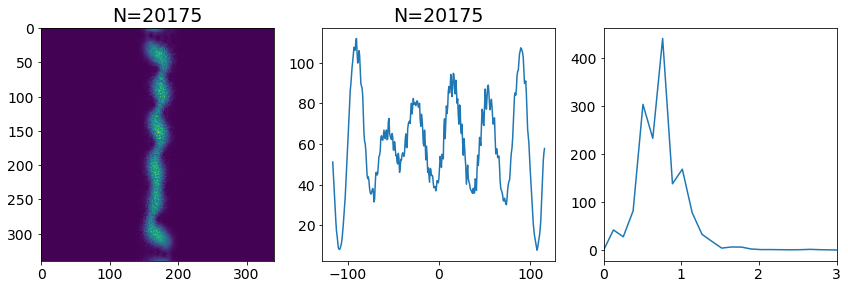

In [103]:
# Do a sample
with h5py.File(datafile, 'r') as f:
    dset = f[sample]
    times = dset.attrs['dt'] * dset.attrs['times'] * omega / (2*np.pi)
    i=100
    cloud = dset[i]
    print(np.sum(cloud)* (fov/DIM)**2)
    sk = process_growth(cloud, plot=True)

In [104]:
# Extract samples and structure factors
growth_list = []
samples_select = np.arange(0,100,9)

with h5py.File(datafile, 'r') as f:
    for key in tqdm(f.keys()):
        dset = f[key]
        results = {}
        results['dsetname'] = key
        results['squeezetime'] = dset.attrs['squeeze']
        
        # Produce the samples
        samples=[]
        for i in tqdm(samples_select, leave=False, desc='samples'):
            cloud = rotate_crop(dset[i], viewx=window, viewy=150, angle=45)
            samples.append(cloud)
        results['samples'] = np.rot90(np.vstack(samples))
        
        # Produce the structure factors
        sks = []
        for cloud in tqdm(dset, leave=False, desc='structure factors'):
            sk = process_growth(cloud, plot=False)
            sks.append(sk)
        results['sk'] = np.array(sks)
        
        growth_list.append(results)

growthdf = pd.DataFrame(growth_list)
growthdf.sort_values(by='squeezetime', inplace=True)

In [105]:
# Evaluate widths
growthdf['widths'] = 1.3#widths_interpolated(growthdf['squeezetime'])

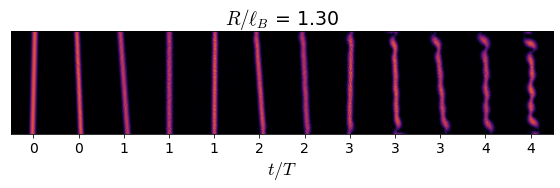

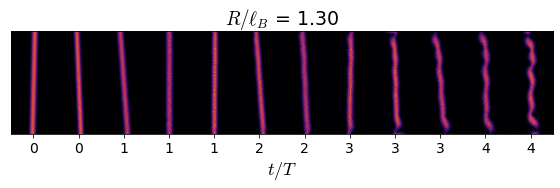

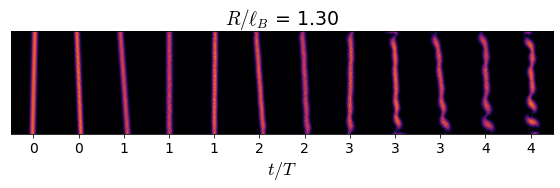

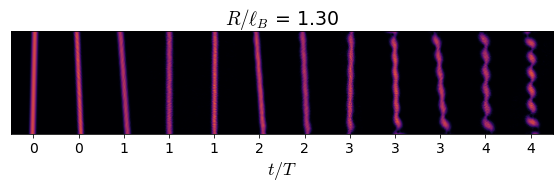

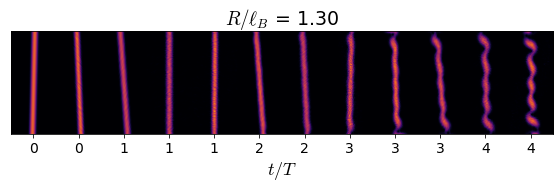

...

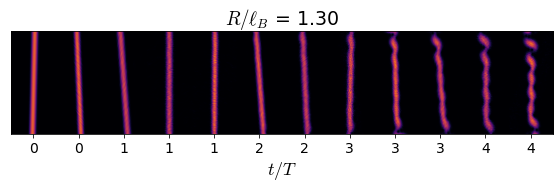

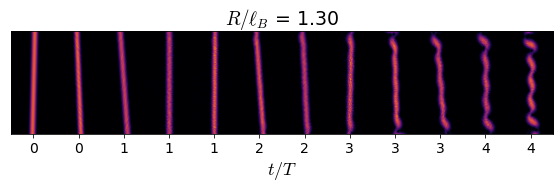

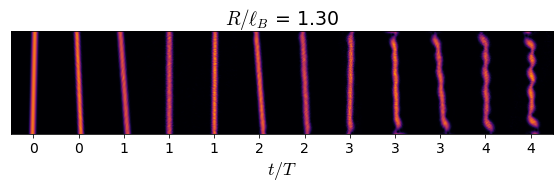

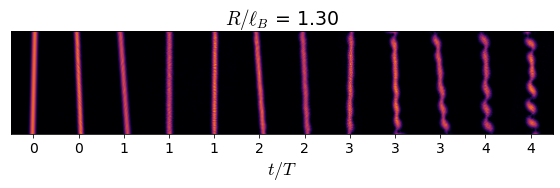

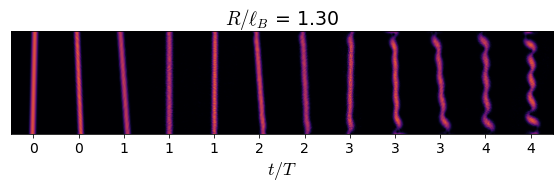

In [106]:
for i,r in growthdf.iterrows():
    plt.subplots(figsize=(8,4))
    plt.imshow(r.samples, cmap='inferno', vmin=0)
    plt.yticks([])
    plt.xticks(75+150*np.arange(len(samples_select)), [f'{x:0.0f}' for x in times[samples_select]])
    plt.xlabel('$t/T$')
    plt.title(f'$R/\ell_B$ = {r.widths:.2f}')
    plt.tight_layout()
#     plt.savefig(f'figures/rotini1d/growths_sep16/samples_{i}.jpg', dpi=120)
    plt.show()

In [107]:
# Evaluate structure factor peak positions (for later peak growth estimation)
growthdf['finalsk'] = None
growthdf['skpeakfit'] = None
for i,r in growthdf.iterrows():
    finalsk = np.mean(r.sk[90:], axis=0)
#     plt.plot(klb, finalsk)
#     plt.xlim([0,3])
#     plt.show()
    growthdf.at[i,'skpeakfit'],_ = curve_fit(gauss, klb, finalsk, [0.8, np.max(finalsk), 0.2])
    growthdf.at[i,'finalsk'] = finalsk
    
        

(0.9, 3.7)

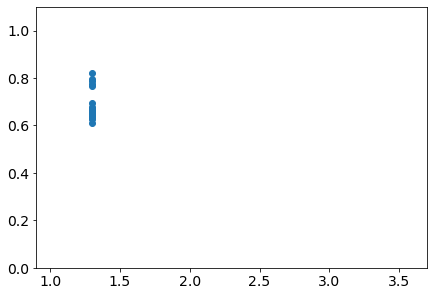

In [108]:
plt.subplots(figsize=(7,4.8))
plt.plot(growthdf.widths, [x[0] for x in growthdf.skpeakfit],'o')
plt.ylim([0,1.1])
plt.xlim([0.9,3.7])

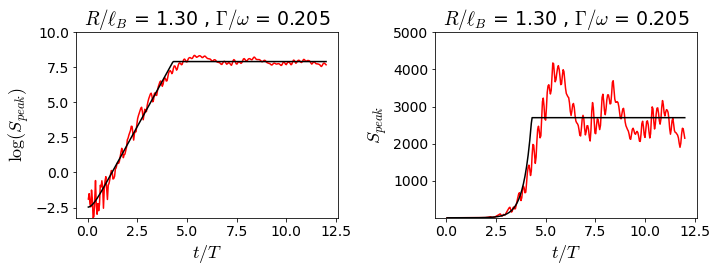

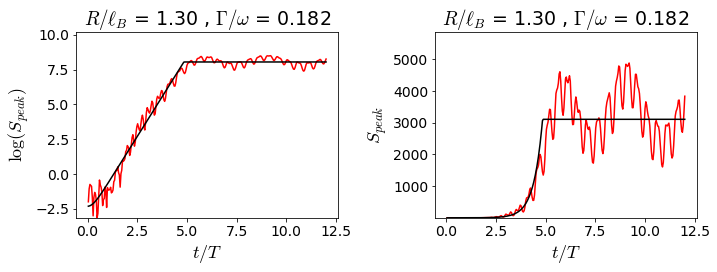

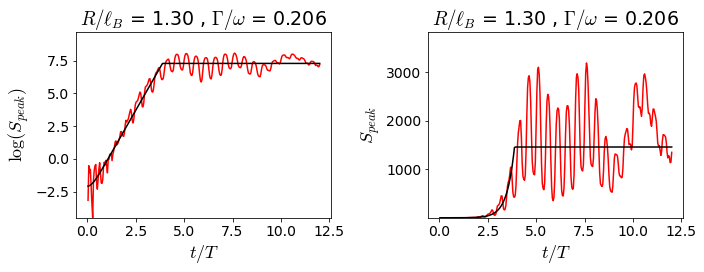

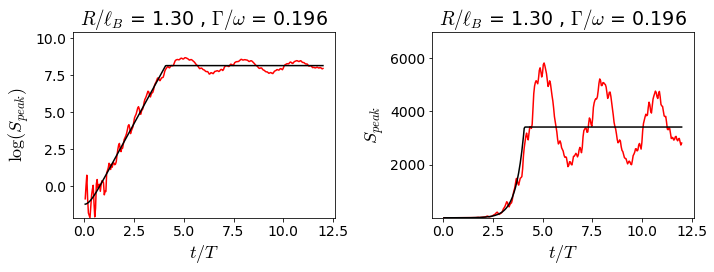

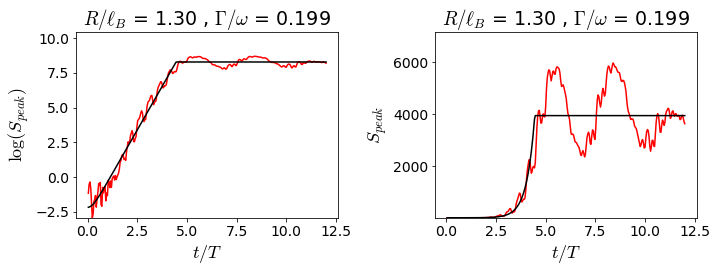

...

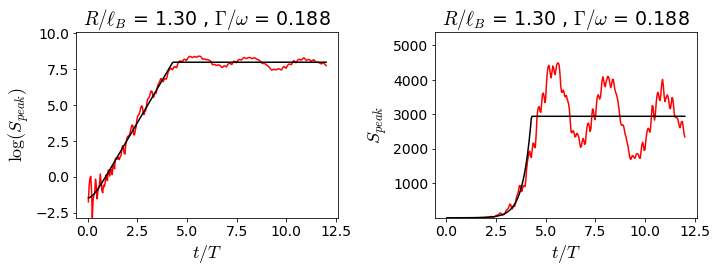

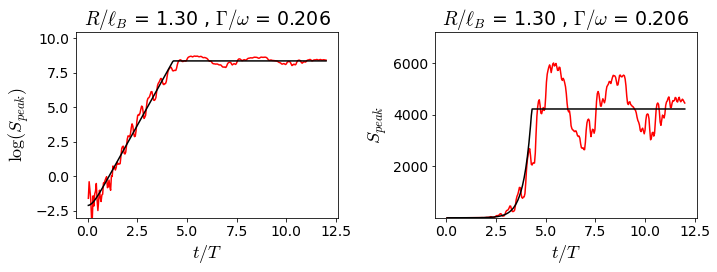

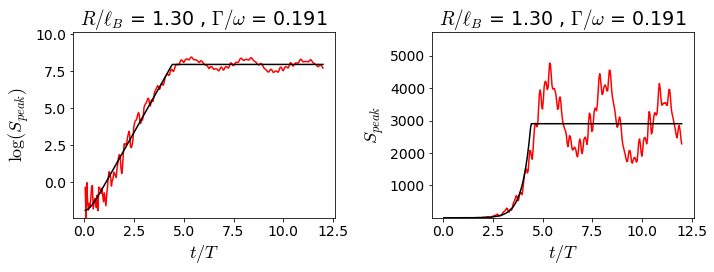

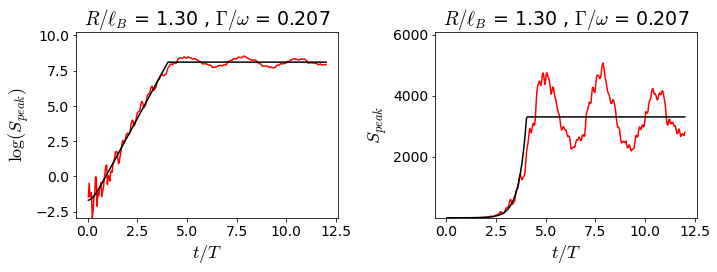

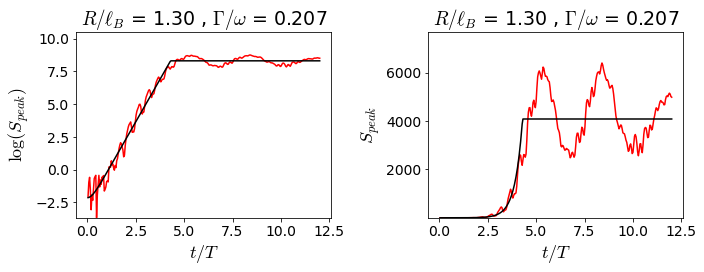

In [109]:
# Evaluate growth rates

growthdf['peakgrowth'] = None
growthdf['peakgrowthfit'] = None

for i,r in growthdf.iterrows():
    peakpos = growthdf.at[i,'skpeakfit'][0]
    kmask = [k>0.8*peakpos and k < 1.2*peakpos for k in klb]
    growth = np.sum(r.sk[1:, kmask], axis=1)
    xs = times
    ys = np.log(growth)
    guess= [1,200000,10]
    f,e = curve_fit(coshfuncsat, xs, ys, guess)
#     fitlim = np.abs(xs - 1.2*f[-1]).argmin()
#     guess= [1,200000]
#     f,e = curve_fit(coshfunc, xs[:fitlim], ys[:fitlim], guess)
    
#     if i==3: f[0]=np.nan

    growthdf.at[i, 'peakgrowth'] = growth
    growthdf.at[i, 'peakgrowthfit'] = f

    _,ax = plt.subplots(ncols=2, figsize=(10,4))
    ax[0].plot(xs,ys,'r', label='data')
    ax[0].plot(xs, coshfuncsat(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
    ax[0].set(xlabel='$t/T$', ylabel='$\log(S_{peak})$', ylim=[min(ys),1.2*np.max(ys)],
              title=f'$R/\ell_B$ = {r.widths:.2f} , $\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
    ax[1].plot(xs,growth,'r-')
    ax[1].plot(xs, np.exp(coshfuncsat(xs,*f)),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
    ax[1].set(xlabel='$t/T$', ylabel='$S_{peak}$', ylim=[min(growth), 1.2*np.max(growth)],
              title=f'$R/\ell_B$ = {r.widths:.2f} , $\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
#         plt.legend()
    plt.tight_layout()
    plt.show()
    

growthdf['peakgrowthrates'] = [r[0]/(2*np.pi) for r in growthdf['peakgrowthfit']]

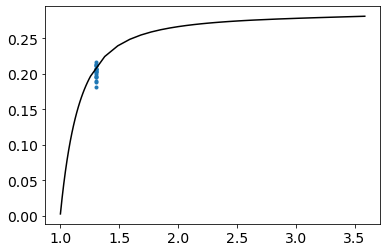

In [110]:
plt.plot(growthdf['widths'], growthdf['peakgrowthrates'],'.')
bdg_growths = np.genfromtxt('data/bdg/ratesvwidths.csv', delimiter=',')
plt.plot(bdg_growths[:,0],2*bdg_growths[:,1],'k-')

In [18]:
GP = {}
GP['widths'] = growthdf['widths']
GP['rates'] = growthdf['peakgrowthrates']
GP['ratemeans'] = growthdf.groupby('widths')['peakgrowthrates'].mean().tolist()
GP['rateerrs'] = growthdf.groupby('widths')['peakgrowthrates'].std().tolist() / np.sqrt(5)

In [19]:
# with open('data/rotini_1064_sep16_20_processed.p', 'wb') as f:
#     pickle.dump(GP, f)

In [20]:
with open('data/rotini_512_sep14_20_processed.p', 'rb') as f:
    GP512 = pickle.load(f)
    
with open('data/rotini_1064_sep16_20_processed.p', 'rb') as f:
    GP1064 = pickle.load(f)
    

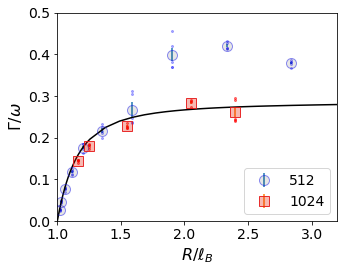

In [21]:
bdg_growths = np.genfromtxt('data/bdg/ratesvwidths.csv', delimiter=',')

SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


plt.subplots(figsize=(5,4))
plt.plot(GP512['widths'], GP512['rates'],'.', markersize=4, c='b', alpha=0.3)
plt.errorbar(np.unique(GP512['widths']), GP512['ratemeans'], GP512['rateerrs'], fmt='o', label='512',
             markersize=10, markerfacecolor=[0.1,0.1,0,0.1], markeredgecolor=[0.1,0.1,0.9,0.5])

plt.plot(GP1064['widths'], GP1064['rates'],'.', markersize=4, c='r', alpha=0.5)
plt.errorbar(np.unique(GP1064['widths']), GP1064['ratemeans'], GP1064['rateerrs'], fmt='s', label='1024',
             markersize=10, markerfacecolor=[0.9,0.1,0,0.3], markeredgecolor=[0.9,0.1,0.1,0.9])


plt.plot(bdg_growths[:,0],2*bdg_growths[:,1],'k-')
plt.ylim([0,0.5])
plt.xlim([1,3.2])
plt.legend(loc=4)
plt.gca().set(xlabel='$R/\ell_B$', ylabel='$\Gamma/\omega$')
plt.tight_layout()
plt.savefig('figures/rotini1d/allgrowths.pdf')
plt.show()

In [114]:
# # save data
# growthsave = np.vstack([growthdf['widths'], rates])
# lengthscalesave = np.vstack([growthdf.widths, [x[0] for x in growthdf.skpeakfit]])

# np.savetxt('data/rotinigrowths_sep16_2020.csv', tosave)

### per k growth rates

In [111]:
growthdfavg = pd.DataFrame()
growthdfavg['squeezetime'] = np.unique(growthdf['squeezetime'])
growthdfavg['widths'] =  widths_interpolated(growthdfavg['squeezetime'])
growthdfavg['sk'] = None
for iavg, ravg in growthdfavg.iterrows():
    growthdfavg.at[iavg,'sk'] = np.mean(growthdf[growthdf['squeezetime']==ravg.squeezetime].sk)
    

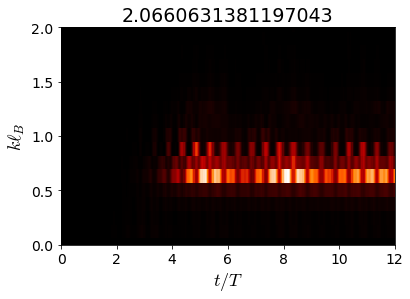

In [112]:
# Averaged s(k,t)
for i,r in growthdfavg.iterrows():
    plt.pcolormesh(np.hstack([[0],times]),klb,np.transpose(r.sk), shading='auto',cmap='gist_heat')
    plt.ylim([0,2])
    plt.xlabel('$t/T$')
    plt.ylabel('$k\ell_B$')    
    plt.title(r.widths)
    plt.show()

In [113]:
for i,r in growthdfavg.iterrows():
    if i==0:
        print(r.widths)
        print(r.squeezetime)
#         samplesk = 10*(np.transpose(r.sk[:-1,:])**.5)/np.max(r.sk)
        samplesk = np.transpose(r.sk[1:,:])/np.max(r.sk)

2.0660631381197043
8000


(0.0, 3.0)

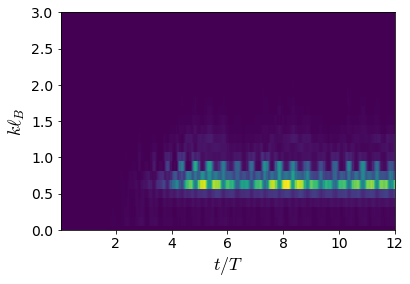

In [114]:
plt.pcolormesh(times,klb,samplesk, shading='auto')
plt.xlabel('$t/T$')
plt.ylabel('$k\ell_B$')
plt.ylim([0,3])

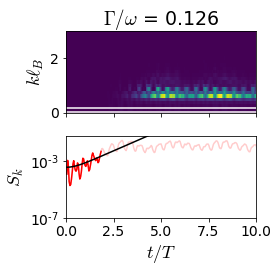

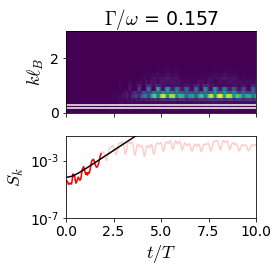

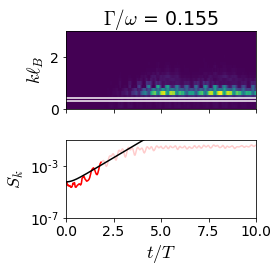

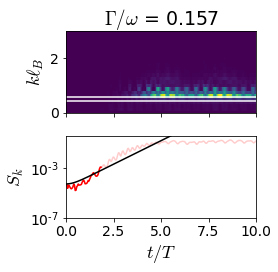

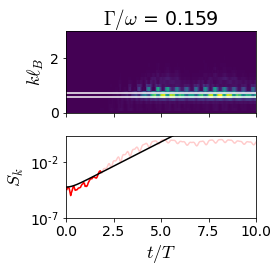

...

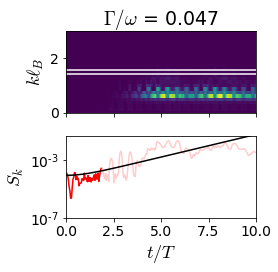

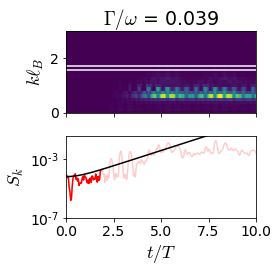

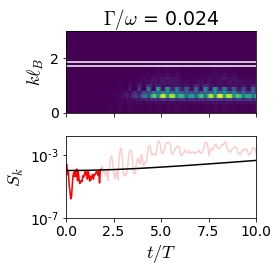

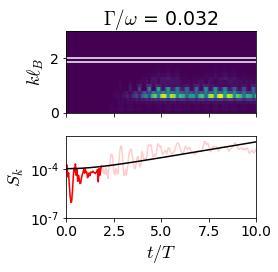

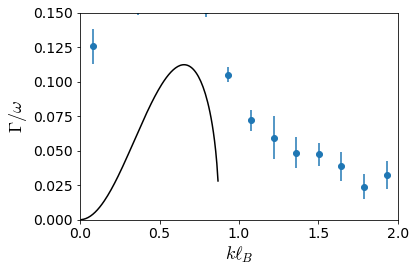

In [146]:
start=0
end=46
numreps = 50
number_of_ks = 15
klbedges = np.linspace(0.01,2,number_of_ks)
testx = np.linspace(0,40,100)

def coshfunc(t,rate, amp):
    return amp*np.cosh(2*rate*t)

rates = []
rerrs = []
for i in tqdm(range(number_of_ks-1),leave=False):
    klbrange = [klbedges[i], klbedges[i+1]]
    kmask = [(klbrange[0]<k) and (k<klbrange[1]) for k in klb]
    component = samplesk[kmask,:]
    growth = np.mean(component, axis=0) #* r.meannumbers
    ys = growth #- np.mean(r.fftprofiles[60:90,:start])* r.meannumbers
    xs = times
#     yerrs = np.mean(r.ffterrs[mask,:], axis=0) * r.meannumbers / np.sqrt(sum(mask))         
    rawrates = []
    for rep in range(numreps):
        mask = sorted([np.random.randint(start,end) for i in range(end-start)])
#         mask = np.arange(end)
        try:
            fr, _ = curve_fit(coshfunc, xs[mask], ys[mask]+1e-4*np.random.rand(end) , [0.1,1e-6],
                bounds=([-0.1,1e-8],[1,1]))
            rawrates.append(fr[0]/(2*np.pi))
            
            
        except:
            pass
        
    
    if np.mean(rawrates)==0:
        rates.append(np.nan)
        rerrs.append(np.nan)
    else:
        rates.append(np.mean(rawrates))
        rerrs.append(np.std(rawrates)/np.sqrt(3))   
        
        
    _,ax = plt.subplots(nrows=2, figsize=(4,4))
    ax[0].pcolormesh(times,klb,samplesk, shading='auto')
    ax[0].set(xlabel='', ylabel='$k\ell_B$',ylim=[0,3],xlim=[0,10],
              title=f'$\Gamma/\omega$ = {np.mean(rawrates):.3f}')
    ax[0].axhline(klbrange[0],c='w')
    ax[0].axhline(klbrange[1],c='w')
    plt.setp(ax[0].get_xticklabels(), visible=False)
    ax[1].plot(xs[start:end],ys[start:end],'r', label='data')
    ax[1].plot(xs,ys,'r', alpha=0.2,label='data')
    ax[1].plot(xs, coshfunc(xs,*fr),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
    ax[1].set(xlabel='$t/T$', ylabel='$S_{k}$', ylim=[1e-7,2*np.max(ys)],yscale='log',xlim=[0,10])
    plt.tight_layout()
    plt.show()     
        
bdgdatgrowth = np.genfromtxt('data/forsm90/bdg90.txt')
plt.plot(bdgdatgrowth[0], bdgdatgrowth[1] ,'k-')
plt.xlim([0,2])
plt.gca().set(xlabel=r'$k\ell_B$', ylabel=r'$\Gamma/\omega$', xlim=[0,2], ylim=[0,0.15])
plt.tight_layout()
#         plt.plot((klbedges[:-1]+klbedges[1:])/2, rates, 'o')
plt.errorbar((klbedges[:-1]+klbedges[1:])/2, rates,yerr=rerrs,fmt= 'o')
plt.show()
    

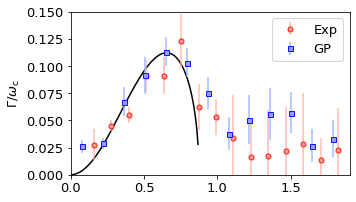

In [36]:
lab90 = np.genfromtxt('data/forsm90/lab90.txt')
plt.figure(figsize=(5,3))
ratesp = np.array(rates)
ratesp[-7:] *=0.4
lab90[2,5] *=0.6
kbincenters = (klbedges[:-1]+klbedges[1:])/2
plt.errorbar(lab90[0], lab90[1],
        yerr=lab90[2],fmt='ro', ms=5, zorder=10,label='Exp',
             markerfacecolor=[1,0.6,0.6],markeredgecolor=[1,0.1,0.05], ecolor=[1,0.7,0.65,0.9])
plt.errorbar(kbincenters, ratesp,
        yerr=rerrs,  fmt='bs', ms=5, zorder=100, label='GP',
             markerfacecolor=[0.6,0.6,1],markeredgecolor=[0.05,0.1,1], ecolor=[0.6,0.7,1,0.9])

plt.plot(bdgdatgrowth[0], bdgdatgrowth[1] ,'k-')
plt.legend()
plt.gca().set(ylabel=r'$\Gamma/\omega_\mathrm{c}$', xlim=[0,1.9], ylim=[0*-0.015,0.15])
plt.show()

## vary bg noise

(0.0, 3.0)

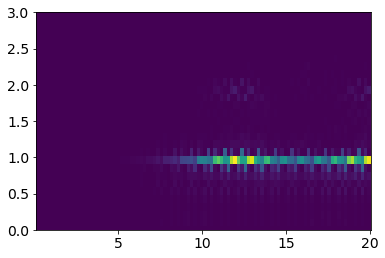

In [61]:
samplesk = growthdf.at[31,'sk']

plt.pcolormesh(times,klb,np.transpose(samplesk[1:]), shading='auto')
plt.ylim([0,3])

In [401]:
df.iloc[5]

gn                                                     0.51
width                                               1.07155
mu                                                 0.695428
rawesq    {{0., 4.815608774000765*^-9}, {0.0093302927360...
esq       [[0.0, 0.009330292736091475, 0.018660585472182...
eimag     [[0.0, 0.009330292736091475, 0.018660585472182...
Name: 5, dtype: object

In [54]:

@np.vectorize
def coshfuncsat(t,rate,amp, tsat):
    return min(np.log(amp*np.cosh(2*rate*t)),np.log(amp*np.cosh(2*rate*tsat)))


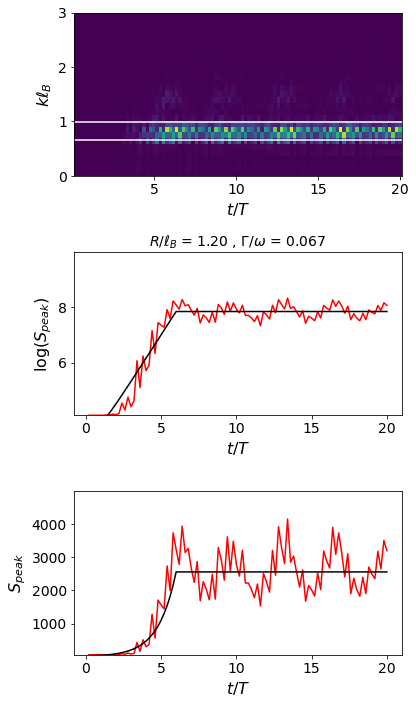

In [59]:
peakgrowthfit = []
for i,r in tqdm(growthdf.iterrows(),leave=False):
        peakpos = growthdf.at[i,'skpeakfit'][0]
        kmask = [k>0.8*peakpos and k < 1.2*peakpos for k in klb]

        noisysk = r.sk.copy()+20# 2*np.random.rand(*np.shape(samplesk))
        
#         plt.imshow(noisysk, vmax=30)
#         plt.show()
        growth = np.sum(noisysk[1:, kmask], axis=1)
        xs = times
        ys = np.log(growth)
        guess= [1,200000,10]
        f,e = curve_fit(coshfuncsat, xs, ys, guess)
    #     fitlim = np.abs(xs - 1.2*f[-1]).argmin()
    #     guess= [1,200000]
    #     f,e = curve_fit(coshfunc, xs[:fitlim], ys[:fitlim], guess)

    #     if i==3: f[0]=np.nan

#         peakgrowthfit.append(f)
        if i==20:
            testpoint = [r.widths, f[0]/(2*np.pi)]
            _,ax = plt.subplots(nrows=3, figsize=(6,10))
            ax[0].pcolormesh(times,klb,np.transpose(noisysk[1:]), shading='auto')
            ax[0].set(xlabel='$t/T$', ylabel='$k\ell_B$',ylim=[0,3])
            ax[0].axhline(0.8*peakpos,c='w')
            ax[0].axhline(1.2*peakpos,c='w')
            ax[1].plot(xs,ys,'r', label='data')
            ax[1].plot(xs, coshfuncsat(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
            ax[1].set(xlabel='$t/T$', ylabel='$\log(S_{peak})$', ylim=[min(ys),1.2*np.max(ys)],
                      title=f'$R/\ell_B$ = {r.widths:.2f} , $\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
            ax[2].plot(xs,growth,'r-')
            ax[2].plot(xs, np.exp(coshfuncsat(xs,*f)),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
            ax[2].set(xlabel='$t/T$', ylabel='$S_{peak}$', ylim=[min(growth), 1.2*np.max(growth)])
            plt.tight_layout()
            plt.show()


In [60]:
rates = [r[0]/(2*np.pi) for r in peakgrowthfit]
plt.figure()
plt.plot(ww,3*np.array(rates),'r.', label='3*data')
plt.plot(ww,np.array(rates),'k.',alpha=0.2, label='data')
# plt.plot(*testpoint, 'gs', label='sample')
plt.plot(bdg_growths[:,0],2*bdg_growths[:,1],'k-', label='bdg')
plt.ylim([0,0.3])
plt.xlim([1,1.7])
plt.title(f'noise level = {noise:.1f}')
plt.gca().set(xlabel='$R/\ell_B$', ylabel='$\Gamma/\omega$')
plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'ww' is not defined

<Figure size 432x288 with 0 Axes>

In [542]:
xs[25]

5.2

In [573]:

@np.vectorize
def coshfuncsat(t,rate,amp, tsat):
    return min(np.arccosh(amp*np.cosh(2*rate*t)),np.log(amp*np.cosh(2*rate*tsat)))


# @np.vectorize
# def coshfuncsat(t,rate,amp, tsat, const):
#     return min(np.log(const + amp*np.cosh(2*rate*t)),np.log(const + amp*np.cosh(2*rate*tsat)))

In [574]:
noises = [0,0.2,2,10]


for noise in noises:
    
        # Evaluate growth rates

    peakgrowthfit = []
    ww = []

    for i,r in tqdm(growthdf.iterrows(),leave=False):
        if r.widths < 1.5:
            ww.append(r.widths)
            peakpos = growthdf.at[i,'skpeakfit'][0]
            kmask = [k>0.8*peakpos and k < 1.2*peakpos for k in klb]

            noisysk = r.sk+ noise*np.random.rand(*np.shape(samplesk)) 
            growth = np.sum(noisysk[1:, kmask], axis=1)
            xs = times
            ys = np.arccosh(growth)
            guess= [1,20,10,1]
            f,e = curve_fit(coshfuncsat, xs[:], ys[:], guess)
#             fitlim = np.abs(xs - 1.2*f[-1]).argmin()

#             guess= [1,200000]
#             fitlim = 25
#             start =13
#             f,e = curve_fit(coshfunc, xs[start:fitlim], ys[start:fitlim], guess)

        #     if i==3: f[0]=np.nan

            peakgrowthfit.append(f)
            if i==20:
                testpoint = [r.widths, f[0]/(2*np.pi)]
                out = f
                fig,ax = plt.subplots(nrows=3, figsize=(6,10))
                pcm= ax[0].pcolormesh(times,klb,np.transpose(noisysk[1:]), shading='auto', vmax=50)
#                 fig.colorbar(pcm, ax=ax[0])
                ax[0].set(xlabel='$t/T$', ylabel='$k\ell_B$',ylim=[0,3])
                ax[0].axhline(0.9*peakpos,c='w')
                ax[0].axhline(1.1*peakpos,c='w')
                ax[1].plot(xs,ys,'r', label='data')
                ax[1].plot(xs, coshfuncsat(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
                ax[1].set(xlabel='$t/T$', ylabel='$\log(S_{peak})$', ylim=[min(ys),1.2*np.max(ys)],
                          title=f'$R/\ell_B$ = {r.widths:.2f} , $\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
                ax[2].plot(xs,growth,'r-')
                ax[2].plot(xs, np.exp(coshfuncsat(xs,*f)),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
                ax[2].set(xlabel='$t/T$', ylabel='$S_{peak}$', ylim=[min(growth), 1.2*np.max(growth)])
            #         plt.legend()
                plt.tight_layout()
                plt.show()


    rates = [r[0]/(2*np.pi) for r in peakgrowthfit]
    plt.figure()
    plt.plot(ww,rates,'r.', label='data')
    plt.plot(*testpoint, 'gs', label='sample')
    plt.plot(bdg_growths[:,0],2*bdg_growths[:,1],'k-', label='bdg')
    plt.ylim([0,0.3])
    plt.xlim([1,1.5])
    plt.title(f'noise level = {noise:.1f}')
    plt.gca().set(xlabel='$R/\ell_B$', ylabel='$\Gamma/\omega$')
    plt.legend()
    plt.tight_layout()
    plt.show()



ValueError: array must not contain infs or NaNs

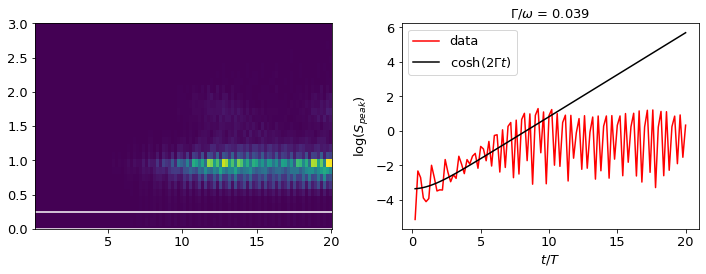

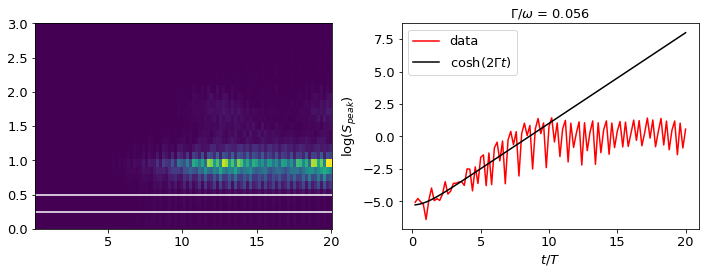

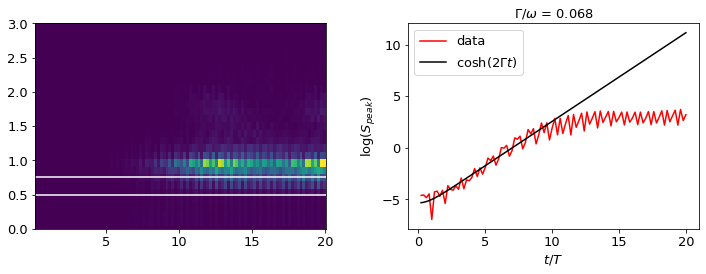

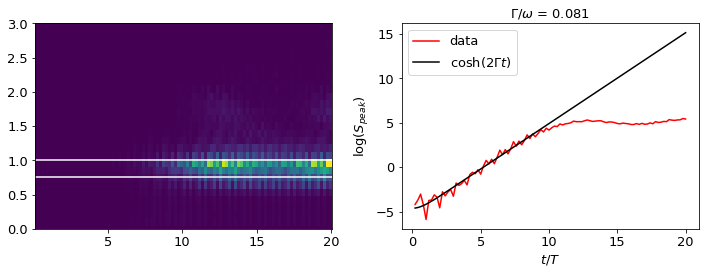

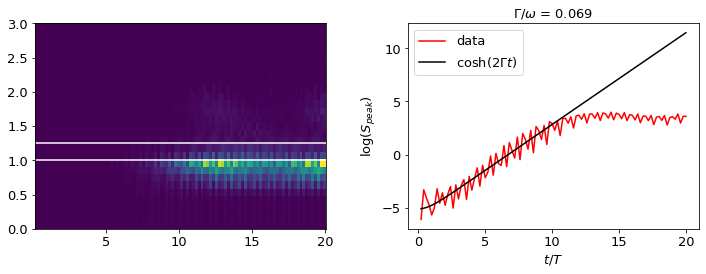

...

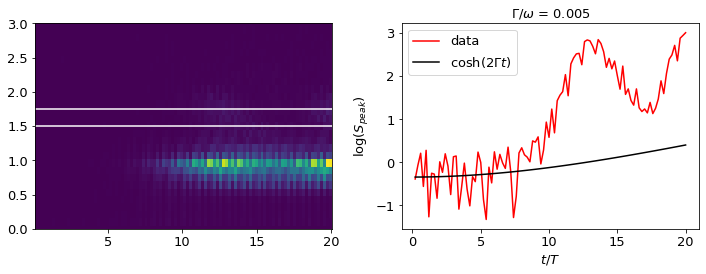

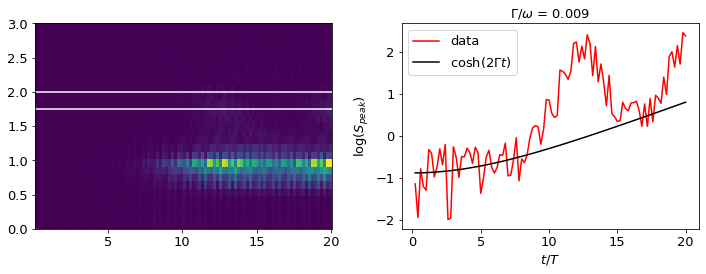

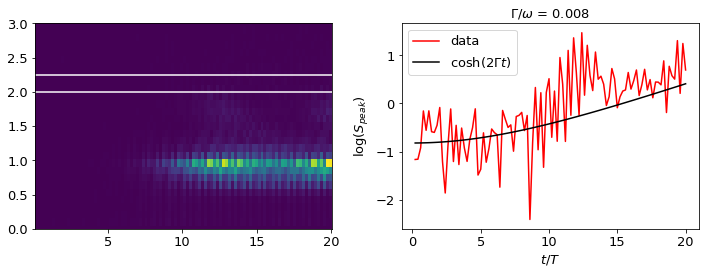

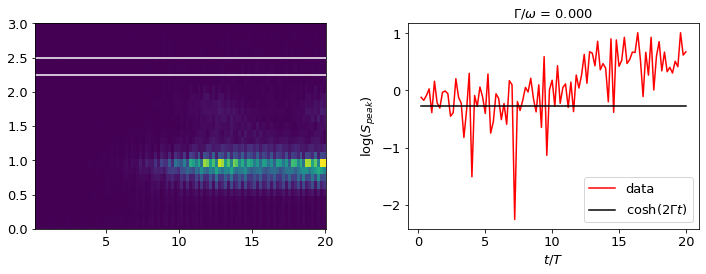

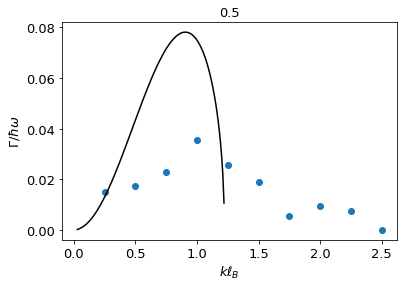

In [432]:
noises = np.linspace(0,0.5,5)
for noise in noises:
    # Evaluate growth rates
    numks = 10
    kedges = np.linspace(0, 2.5, numks+1)
    growths = []
    noisysk = samplesk+ noise*np.random.rand(*np.shape(samplesk))
    for j in range(numks):
        kmask = [k>kedges[j] and k < kedges[j+1] for k in klb]
        growth = np.sum(noisysk[1:, kmask], axis=1)
        xs = times
        ys = np.log(growth)
        
#         guess= [1,200000,5]
#         f,e = curve_fit(coshfuncsat, xs, ys, guess)
        guess= [1,200000]
        f,e = curve_fit(coshfunc, xs[:40], ys[:40], guess)

        growths.append(f[0])

        _,ax = plt.subplots(ncols=2, figsize=(10,4))
        ax[0].pcolormesh(times,klb,np.transpose(noisysk[1:]), shading='auto')
        ax[0].set(ylim=[0,3])
        ax[0].axhline(kedges[j],c='w')
        ax[0].axhline(kedges[j+1],c='w')
        ax[1].plot(xs,ys,'r', label='data')
        ax[1].plot(xs, coshfunc(xs,*f),'k', label='$\cosh(2\Gamma t)$')
        ax[1].set(xlabel='$t/T$', ylabel='$\log(S_{peak})$', title=f'$\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
        plt.legend()
        plt.tight_layout()
        plt.show()


    plt.plot(kedges[1:],np.array(growths)/(2*np.pi),'o')


    plt.plot(df.at[4,'eimag'][0],2*df.at[4,'eimag'][1],'k')

    plt.ylabel('$\Gamma/\hbar\omega$')
    plt.xlabel('$k\ell_B$')
    plt.title(noise)
    plt.show()

## SM90 Plot with lab data

In [116]:
klblong = np.genfromtxt('data/fftprofiles/longtime/klb.txt')
tomegalong = np.genfromtxt('data/fftprofiles/longtime/tomega.txt')
df_long = pd.DataFrame()
df_long['x'] = [10,30,90]
df_long['fftprofiles'] = None
for i,r in df_long.iterrows():
    fftprofiles = np.genfromtxt(f'data/fftprofiles/longtime/fftprofiles_{r.x:.0f}.txt')
    df_long.at[i, 'fftprofiles'] = fftprofiles

In [117]:
klbshort = np.genfromtxt('data/fftprofiles/shorttime/klb.txt')
tomegashort = np.genfromtxt('data/fftprofiles/shorttime/tomega.txt')
df_short = pd.DataFrame()
df_short['x'] = [10,30,50,70,90,110]
df_short['fftprofiles'] = None
for i,r in df_short.iterrows():
    fftprofiles = np.genfromtxt(f'data/fftprofiles/shorttime/fftprofiles_{r.x:.0f}.txt')
    df_short.at[i, 'fftprofiles'] = fftprofiles

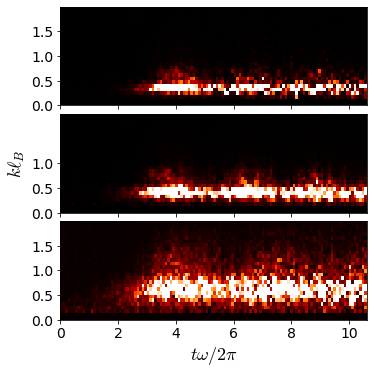

In [118]:
# ky = 2*np.pi*dk*np.arange(np.shape(fftprofiles)[0])
# lb = np.sqrt(cst.hbar/(2*cstNa.mass * 88.6 * 2 *np.pi))
X, Y = np.meshgrid(np.hstack([tomegashort,tomegalong[1:]]),klbshort)
cmap = 'gist_heat'
pc = 'k'
plt.subplots(figsize=(5,5))
ax1 = plt.subplot(311)
ax1.pcolormesh(X, Y, np.hstack([df_short.fftprofiles[0],df_long.fftprofiles[0][:,1:]]), vmax=.05, rasterized=True, cmap=cmap)
plt.setp(ax1.get_xticklabels(), visible=False)
ax1.invert_yaxis()
ax1.set(ylim=[0, 2], yticks=[0,0.5,1,1.5])
ax2 = plt.subplot(312)
ax2.pcolormesh(X, Y, np.hstack([df_short.fftprofiles[1],df_long.fftprofiles[1][:,1:]]), vmax=.05, rasterized=True, cmap=cmap)
plt.setp(ax2.get_xticklabels(), visible=False)
ax2.set(ylim=[0, 2], ylabel='$k\ell_B$', yticks=[0,0.5,1])
ax3 = plt.subplot(313)
ax3.pcolormesh(X, Y, np.hstack([df_short.fftprofiles[4],df_long.fftprofiles[2][:,1:]]), vmax=.05, rasterized=True, cmap=cmap)
ax3.set(ylim=[0, 2], yticks=[0,0.5,1,1.5])
ax3.set_xlabel('$t\omega/2\pi$')
plt.tight_layout(pad=0)
# # plt.savefig('allgrowthFFTs_9.pdf')
# plt.show()

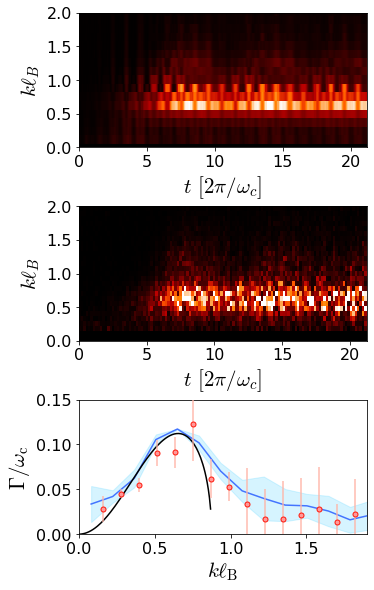

In [257]:
lab90 = np.genfromtxt('data/forsm90/lab90.txt')

SMALL_SIZE = 16
MEDIUM_SIZE = 21
BIGGER_SIZE = 22
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)   # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rcParams["mathtext.fontset"] = "cm"

plt.figure(figsize=(5,8))
plt.subplot(3,1,1)
for i,r in growthdfavg.iterrows():
    if i==4:
        plt.pcolormesh(0.9*times,klb,10*(np.transpose(r.sk[1:])**.5)/np.max(r.sk),
                       vmin=1e-8,vmax=1e-1, shading='auto',rasterized=True,cmap='gist_heat')
    if i==0:
        plt.pcolormesh(2*(times-1.1),klb,10*(np.transpose(r.sk[1:])**.5)/np.max(r.sk),
                       vmin=1e-8,vmax=0.17, shading='auto',rasterized=True,cmap='gist_heat')
        
plt.gca().set(ylim=[0, 2],xlim=[0,21.2], yticks=[0,0.5,1,1.5,2])
# plt.colorbar()
plt.gca().set_xlabel('$t$ $[2\pi/\omega_c]$')
plt.ylabel('$k\ell_B$')  

plt.subplot(3,1,2)
plt.pcolormesh(2*X, Y, np.hstack([df_short.fftprofiles[4],df_long.fftprofiles[2][:,1:]]),
               vmin=1e-7,vmax=1e-1, rasterized=True, cmap=cmap)
plt.gca().set(ylim=[0, 2], yticks=[0,0.5,1,1.5,2])
# plt.colorbar()
plt.gca().set_xlabel('$t$ $[2\pi/\omega_c]$')
plt.ylabel('$k\ell_B$')  

plt.subplot(3,1,3)
ratesp = 0.67*np.array(rates)
rerrsp = 1.6*np.array(rerrs)
ratesp[:2]*=0.4
ratesp[2]*=0.6
ratesp[4]*=1.1

# ratesp[-7:] *=0.4
# ratesp[-6] *=0.8
# lab90[2,5] *=0.6
# lab90[2,-9:] *=0.8
kbincenters = (klbedges[:-1]+klbedges[1:])/2
plt.errorbar(lab90[0], lab90[1],
        yerr=lab90[2],fmt='ro', ms=5, zorder=10,label='Exp',
             markerfacecolor=[1,0.6,0.6],markeredgecolor=[1,0.1,0.05], ecolor=[1,0.7,0.65,0.9])
plt.plot(kbincenters, ratesp,'-', color=[0.2,0.4,1,0.9])
plt.fill_between(kbincenters, ratesp-rerrsp,  ratesp+rerrsp, color=[0.2,0.8,1,0.2] )

plt.plot(bdgdatgrowth[0], bdgdatgrowth[1] ,'k-')
plt.gca().set(ylabel=r'$\Gamma/\omega_\mathrm{c}$', xlim=[0,1.9], ylim=[0*-0.015,0.15], xlabel='$k\ell_\mathrm{B}$')
plt.tight_layout(pad=0)
plt.savefig('data/forsm90/mainplot.pdf')
plt.show()

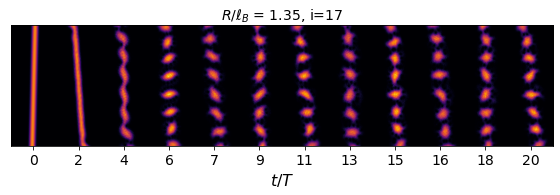

In [266]:
for i,r in growthdf.iterrows():
#     if r.squeezetime==20000:
    if i==17:
        plt.subplots(figsize=(8,4))
        plt.imshow(r.samples, cmap='inferno', vmin=0)
        plt.yticks([])
        plt.xticks(75+150*np.arange(len(samples_select)), [f'{x:0.0f}' for x in times[samples_select]])
        plt.xlabel('$t/T$')
        plt.title(f'$R/\ell_B$ = {r.widths:.2f}, i={i}')
        plt.tight_layout()
    #     plt.savefig(f'figures/rotini1d/growths_sep16/samples_{i}.jpg', dpi=120)
        plt.show()

In [253]:
samples_select

array([ 0,  9, 18, 27, 36, 45, 54, 63, 72, 81, 90, 99])

In [254]:
# Extract samples and structure factors
growth_list = []
samples_select = np.arange(5,57,7)
i=0
with h5py.File(datafile, 'r') as f:
    for key in tqdm(f.keys()):
        dset = f[key]
        results = {}
        results['dsetname'] = key
        results['squeezetime'] = dset.attrs['squeeze']
        if i==17:
            # Produce the samples
            samples=[]
            for i in tqdm(samples_select, leave=False, desc='samples'):
                cloud = rotate_crop(dset[i], viewx=350, viewy=350, angle=45)
                samples.append(cloud)
            results['samples'] = np.rot90(np.vstack(samples))
            break
        else:
            i+=1


(-0.5, 2799.5, 349.5, -0.5)

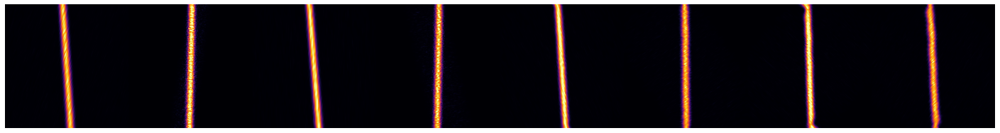

In [255]:
plt.figure(figsize=(25,4))
plt.imshow(results['samples'], cmap='inferno',vmax=8e12)
plt.axis('off')
# plt.savefig('data/forsm90/GP90_2.pdf')

## sk width vs time

Text(0, 0.5, '$k\\ell_B$')

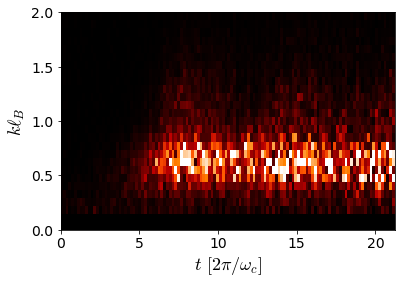

In [165]:
plt.figure()
plt.pcolormesh(2*X, Y, np.hstack([df_short.fftprofiles[4],df_long.fftprofiles[2][:,1:]]),
               vmin=1e-7,vmax=1e-1, rasterized=True, cmap=cmap)
plt.gca().set(ylim=[0, 2], yticks=[0,0.5,1,1.5,2])
# plt.colorbar()
plt.gca().set_xlabel('$t$ $[2\pi/\omega_c]$')
plt.ylabel('$k\ell_B$')  


In [166]:
sk = np.hstack([df_short.fftprofiles[4],df_long.fftprofiles[2][:,1:]])

In [167]:
np.shape(sk)

(250, 122)

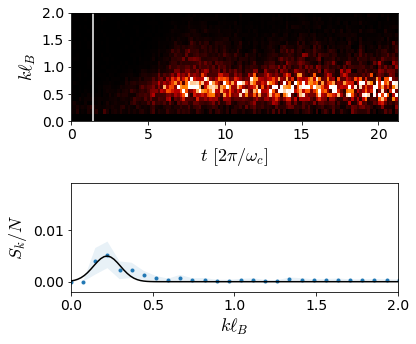

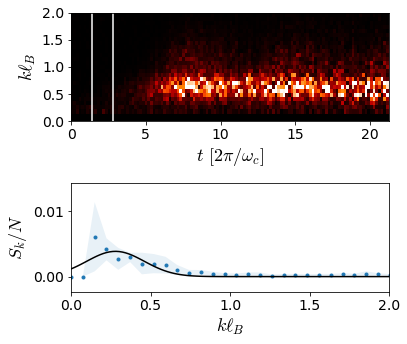

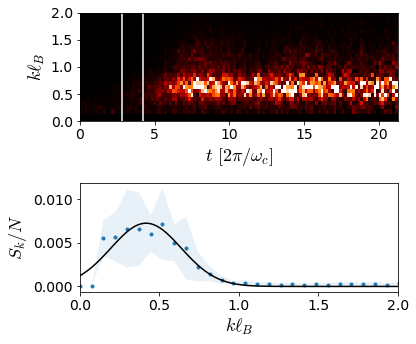

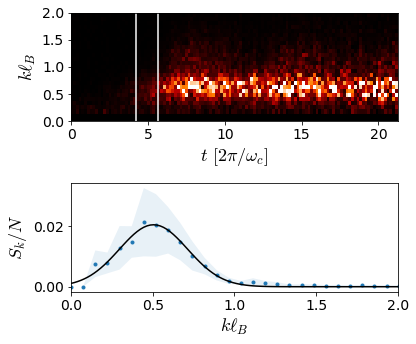

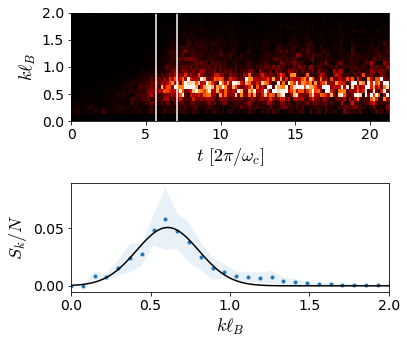

...

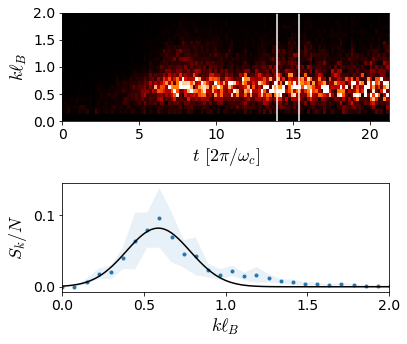

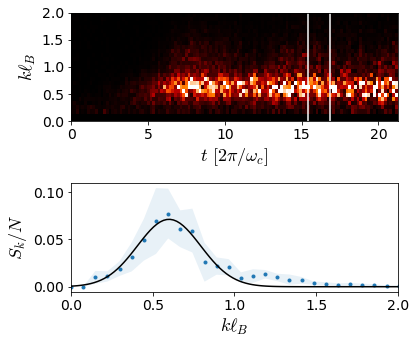

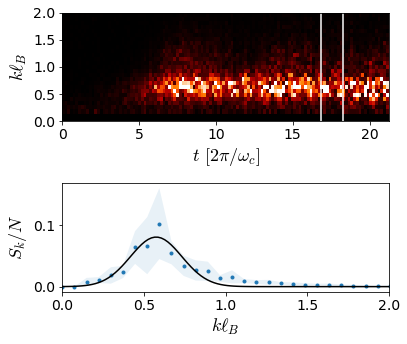

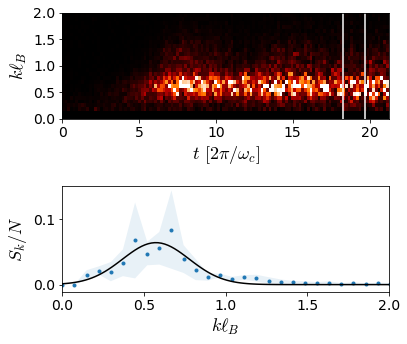

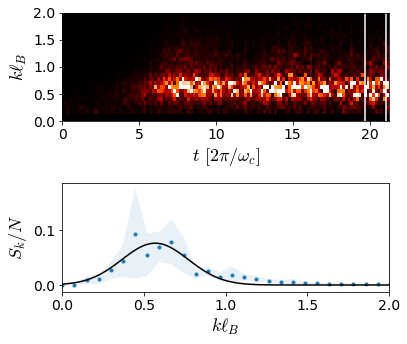

In [250]:
numslices = 15
interval = np.shape(sk)[1]//numslices
widths = []
werrs = []
for slice in range(numslices):
    f,ax=plt.subplots(nrows=2, figsize=(6,5))
    ax[0].pcolormesh(2*X, Y, np.hstack([df_short.fftprofiles[4],df_long.fftprofiles[2][:,1:]]),
                   vmin=1e-7,vmax=1e-1, rasterized=True, cmap=cmap)
    ax[0].set(ylim=[0, 2], yticks=[0,0.5,1,1.5,2],xlabel='$t$ $[2\pi/\omega_c]$',ylabel='$k\ell_B$')  
    ax[0].axvline(2*X[0,slice*interval],c='w')  
    ax[0].axvline(2*X[0,(slice+1)*interval],c='w')  
    means = np.mean(sk[:,slice*interval:(slice+1)*interval], axis=1)
    errs = np.std(sk[:,slice*interval:(slice+1)*interval], axis=1)
    ax[1].plot(Y[:,0],means,'.')
    ax[1].fill_between(Y[:,0],means+errs, means-errs, alpha=0.1)
    f,e = curve_fit(gauss,Y[:,0],means, [0.1,0.01,0.1])
    widths.append(f[-1])
    werrs.append(np.sqrt(np.diag(e))[-1])
    ax[1].plot(np.linspace(0,2,100),gauss(np.linspace(0,2,100),*f),'-k')
    ax[1].set(xlim=[0,2], xlabel='$k\ell_B$', xticks=[0,0.5,1,1.5,2], ylabel='$S_k/N$')
    plt.tight_layout()
    plt.show()

[Text(0.5, 0, '$t$ $[2\\pi/\\omega_c]$'), Text(0, 0.5, '$\\Delta k\\ell_B$')]

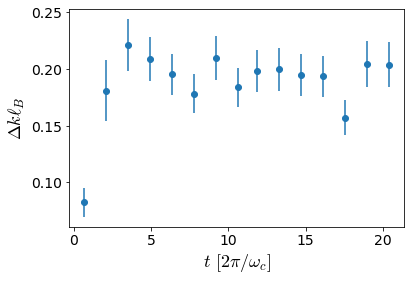

In [251]:
plt.errorbar(2*X[0,(interval//2)::interval],widths,werrs,fmt='o')
plt.gca().set(xlabel='$t$ $[2\pi/\omega_c]$',ylabel='$\Delta k\ell_B$')  

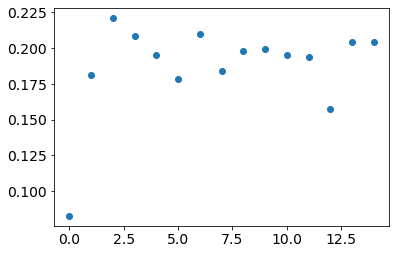

In [235]:
plt.plot(widths,'o')

In [236]:
werrs

[array([ 1.12089530e-08, -4.95374564e-06,  1.64832774e-04]),
 array([-7.14170095e-05, -7.47744294e-06,  7.33058165e-04]),
 array([-2.03925379e-05, -8.50960481e-06,  5.29235929e-04]),
 array([-1.64173817e-06, -1.84900180e-05,  3.76950282e-04]),
 array([-3.20583562e-08, -4.28005461e-05,  3.30710577e-04]),
 array([-3.56216727e-09, -6.85906791e-05,  2.89706056e-04]),
 array([-1.17345175e-07, -6.17417192e-05,  3.78195442e-04]),
 array([-7.55107490e-09, -5.55543370e-05,  3.02920386e-04]),
 array([-7.50402402e-08, -5.27743930e-05,  3.41729776e-04]),
 array([-1.09171636e-07, -6.30629015e-05,  3.45876836e-04]),
 array([-6.16960640e-08, -7.12772418e-05,  3.40327611e-04]),
 array([-3.38856079e-08, -6.04782892e-05,  3.28098608e-04]),
 array([-3.56723505e-10, -5.95509548e-05,  2.32439561e-04]),
 array([-2.50034236e-07, -6.30813505e-05,  4.03007876e-04]),
 array([-2.71604865e-07, -7.47209376e-05,  3.98228020e-04])]

## Withwithout noise SM

In [448]:
def noiseMaker(amp=0.):
    noise = (0.j)*np.zeros((DIM,DIM))
    for i in range(DIM):
        for j in range(DIM):
            noise[i,j]= np.exp(amp * 1.j * 2*np.pi * (0.5-np.random.rand()))
    return noise


# generate data        
dt = 2e-5

def compute_rotini_growth(startStrip, amps, frames=50, noises=5, runTime=50000,
                   dsname='rotini', datafile='data/rotini_growth_512_Nov_18_2020.hdf5'):
    
    times = [runTime // frames] * frames
    
    with h5py.File(datafile, 'w') as f:
        
        for amp in tqdm(amps):
            squeeze=12000
            squeezeStrip = deepcopy(startStrip)
            squeezeStrip.env.rotating_frame(omegaR=omega*np.ones(squeeze))
            squeezeStrip.env.absorbing_boundaries(strength=1, radius=1.1*e.fov/2)
            squeezeStrip.evolve(steps=squeeze, cooling=0.0, dt=5e-5) 

            for noisei in tqdm(range(noises), leave=False):
                rotini = deepcopy(squeezeStrip)
                rotini.env.harmonic_potential(omega=omega, epsilon=0.0)
                rotini.Psi *= noiseMaker(amp)

                dset = f.create_dataset(dsname + f'_noiseamp_{amp}_noiserep_{noisei}',
                                        (frames+1, DIM, DIM), dtype='float32')
                dset[0] = np.float32(rotini.density.copy())
                dset.attrs['times'] = np.cumsum(times)
                dset.attrs['dt'] = dt
                dset.attrs['noise'] = amp
                i=1

                for steps in tqdm(times, leave=False):
                    rotini.env.rotating_frame(omegaR=[omega]*steps)
                    rotini.evolve(steps=steps, cooling=0.0, dt=dt)
                    dset[i] = np.float32(rotini.density.copy())
                    i += 1


startStrip = deepcopy(hallstrip)
# amps=[0,0.07,0.14,0.21,0.28]
# amps=[0]

compute_rotini_growth(startStrip=startStrip, amps=amps, datafile='data/rotini_growth_512_Nov_18_2020_nonoise.hdf5')
    

In [5]:
# Extract samples and structure factors

samples_select = np.arange(0,55,10)
i=0
datafile='data/rotini_growth_512_Nov_18_2020_noise_0.hdf5'
with h5py.File(datafile, 'r') as f:
    for key in tqdm(f.keys()):
        dset = f[key]
        times=dset.attrs['times']*dset.attrs['dt']*10
        if i==0:
            # Produce the samples
            samples=[]
            for i in tqdm(samples_select, leave=False, desc='samples'):
                cloud = rotate_crop(dset[i], viewx=250, viewy=150, angle=45)
                samples.append(cloud)
            samples_noise = np.rot90(np.vstack(samples))
            break
        else:
            i+=1
i=0
datafile='data/rotini_growth_512_Nov_18_2020_nonoise.hdf5'
with h5py.File(datafile, 'r') as f:
    for key in tqdm(f.keys()):
        dset = f[key]
        if i==0:
            # Produce the samples
            samples=[]
            for i in tqdm(samples_select, leave=False, desc='samples'):
                cloud = rotate_crop(dset[i], viewx=250, viewy=150, angle=45)
                samples.append(cloud)
            samples_nonoise = np.rot90(np.vstack(samples))
            break
        else:
            i+=1



In [6]:
samples_select

array([ 0, 10, 20, 30, 40, 50])

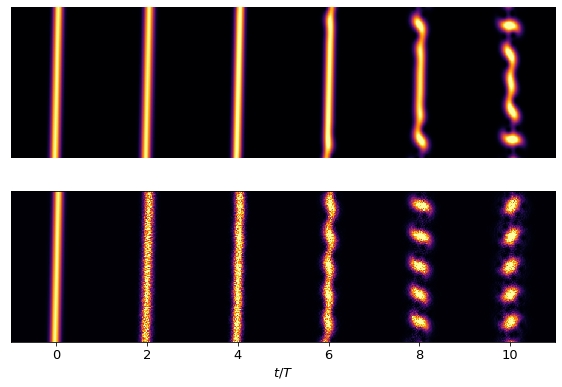

In [10]:
f,ax = plt.subplots(figsize=(8,6), nrows=2)
ax[0].imshow(samples_nonoise, cmap='inferno',vmax=3e12, interpolation='nearest')
ax[0].set_yticks([])
# ax[0].set_xticks(75+150*np.arange(len(samples_select)), [f'{x:0.0f}' for x in np.hstack([[0] ,times])[samples_select]] )
ax[0].axis('off')
# plt.xlabel('$t/T$')

ax[1].imshow(samples_noise, cmap='inferno',vmax=3e12, interpolation='nearest')

plt.yticks([])
plt.xticks(75+150*np.arange(len(samples_select)), [f'{x:0.0f}' for x in np.hstack([[0] ,times])[samples_select]] )
plt.xlabel('$t/T$')
plt.tight_layout()
plt.savefig('data/withwithoutnoise.pdf')

## Old processing notes

In [34]:
dx = fov/DIM
window = 400
x  = dx * (np.arange(window) - window//2)
dk = 1/(window * dx)
k = dk * np.arange(window)
mass = 3.8e-26
lb = np.sqrt(hbar / (2*mass *omega))
klb = lb * k * (2*np.pi)

def process_growth(psi, plot=False):
    density = (np.abs(psi) ** 2) # need to check calibrations
    cloud = rotate_crop(density, viewx=window, viewy=window, angle=43)
    xprofile = np.sum(cloud, axis=0) 
    sk = np.abs(np.fft.fft(xprofile - np.mean(xprofile))) **2  / np.sum(xprofile)
#     gaussfit,_ = curve_fit(gauss, x, xprofile, [0, np.max(xprofile), 6e-6])
    if plot: 
        f,a = plt.subplots(figsize=(12,8),ncols=3)
        a[0].imshow(np.rot90(cloud))
        a[1].plot(1e6*x,xprofile)
        a[1].set_aspect(1./a[1].get_data_ratio())
        a[2].plot(klb,sk)
        a[2].set(xlim = [0,3])
        a[2].set_aspect(1./a[2].get_data_ratio())
#         a[2].plot(x,gauss(x,*gaussfit))
        plt.tight_layout()
        plt.show()
    return sk

#fitting 

@np.vectorize
def coshfuncsat(t,rate,amp, tsat):
    return min(np.log(amp*np.cosh(2*rate*t)),np.log(amp*np.cosh(2*rate*tsat)))


def coshfunc(t,rate,amp):
    return np.log(amp*np.cosh(2*rate*t))

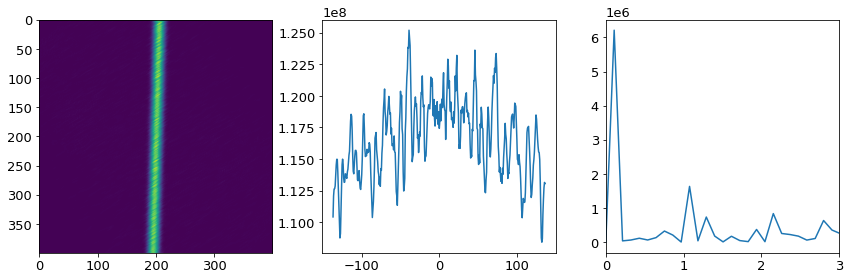

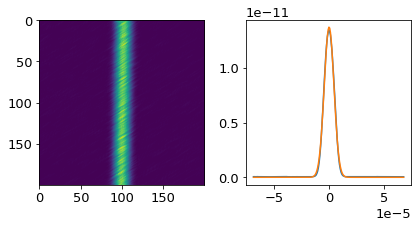

1.335212044194789


In [37]:
# tests with old data

with h5py.File('data/rotiniMovie.hdf5', 'r') as f:
    dset = f['rotini']
    i=6
    cloud = dset[i]
    sk = process_growth(cloud, plot=True)
    width = find_width(np.abs(cloud)**2, plot=True)
    print(np.sqrt(2) * width / lb)

In [38]:
# tests with old data
sks = []
with h5py.File('data/rotiniMovie.hdf5', 'r') as f:
    dset = f['rotini']
    times = dset.attrs['dt'] * np.cumsum(dset.attrs['times']) * omega / (2*np.pi)
    for i in tqdm(range(len(dset))):
        cloud = dset[i]
        sks.append(process_growth(cloud, plot=False))

In [54]:
select = np.arange(0,500,50)
clouds = []
with h5py.File('data/rotiniMovie.hdf5', 'r') as f:
    dset = f['rotini']
    for i in select:
        density = (np.abs(dset[i]) ** 2) # need to check calibrations
        cloud = rotate_crop(density, viewx=window, viewy=150, angle=45)
        clouds.append(cloud)
        


In [61]:
from matplotlib.colors import LinearSegmentedColormap

cdict = {'red':  [[0.0, 0.0, 0.0],
                 [1.0,0,0]],
        'green': [[0.0, 0.0, 0.0],
                 [0.3,0,0],
                 [1.0,1,1]],
        'blue':  [[0.0, 0.0, 0.0],
                 [0.3,0.8,0.8],
                  [1.0,0.8,1]]}
newcmp = LinearSegmentedColormap('testCmap', segmentdata=cdict, N=256)

NameError: name 'clouds' is not defined

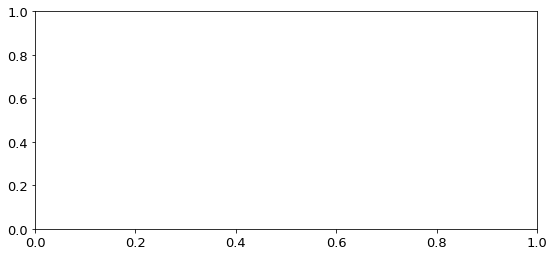

In [11]:
plt.subplots(figsize=(9,4))
plt.imshow(np.rot90(np.vstack(clouds)), cmap='inferno', vmin=0, vmax=7e6)
plt.yticks([])
plt.xticks(75+150*np.arange(len(select)), [f'{x:0.0f}' for x in times[select]])
plt.xlabel('$t/T$')
plt.savefig('figures/rotini1d/GPsamples_2.pdf')
plt.show()

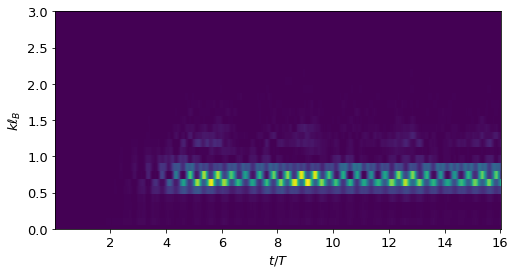

In [290]:
plt.subplots(figsize=(8,4))
plt.pcolormesh(times,klb,np.transpose(sks[1:]), shading='auto')
plt.ylim([0,3])
plt.xlabel('$t/T$')
plt.ylabel('$k\ell_B$')
plt.show()

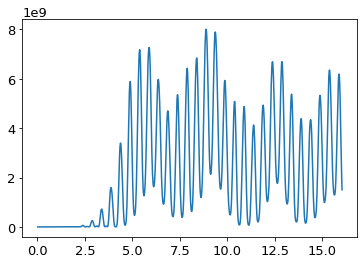

In [298]:
plt.plot(xs,np.array(sks)[1:,7])

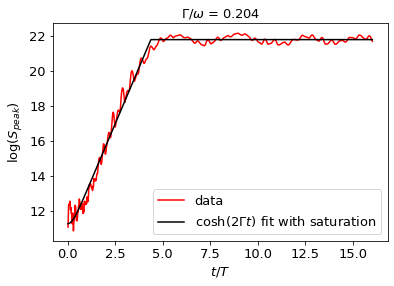

In [296]:
growth = np.mean(np.array(sks)[1:,6:9], axis=1)
xs = times
ys = np.log(growth)
guess= [1,200000,5]
plt.plot(xs,ys,'r', label='data')
# plt.plot(xs, coshfuncsat(xs,*guess))
f,e = curve_fit(coshfuncsat, xs, ys, guess)
plt.plot(xs, coshfuncsat(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
plt.xlabel('$t/T$')
plt.ylabel('$\log(S_{peak})$')
plt.title(f'$\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
plt.legend()
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


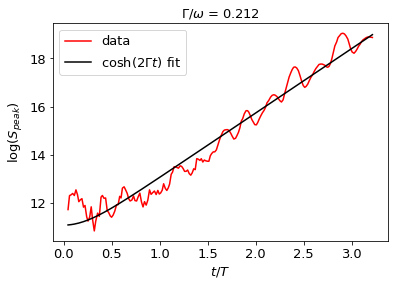

In [294]:
growth = np.mean(np.array(sks)[2:200,6:9], axis=1)
xs = times[2:200]
ys = np.log(growth)
guess= [1,200000]
plt.plot(xs,ys,'r', label='data')
# plt.plot(xs, coshfunc(xs,*guess))
f,e = curve_fit(coshfunc, xs, ys, guess)
plt.plot(xs, coshfunc(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit')
plt.ylabel('$\log(S_{peak})$')
plt.title(f'$\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
plt.xlabel('$t/T$')
plt.legend()
plt.show()

In [283]:
f[0]/(2*np.pi)

0.007925996963464917

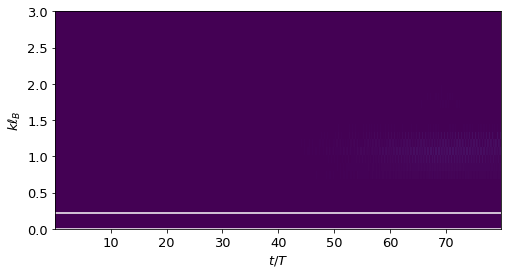

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


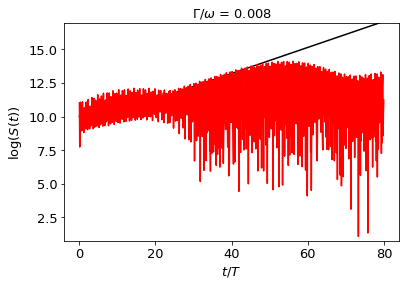

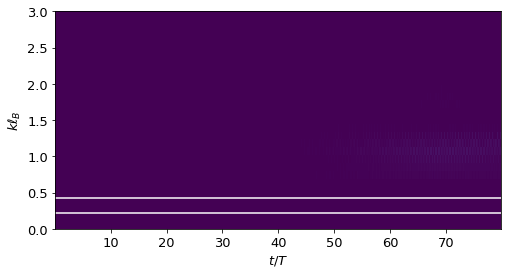

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


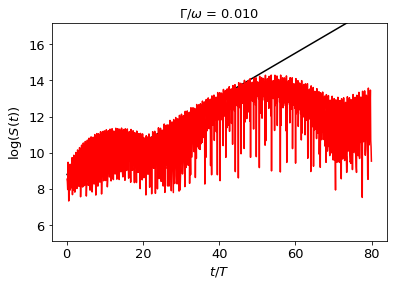

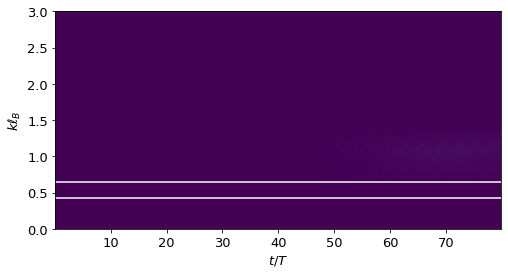

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


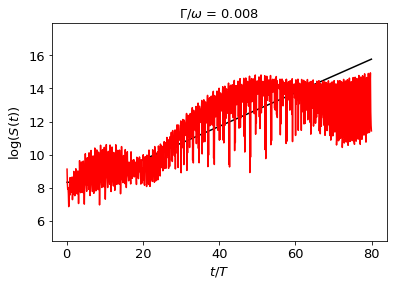

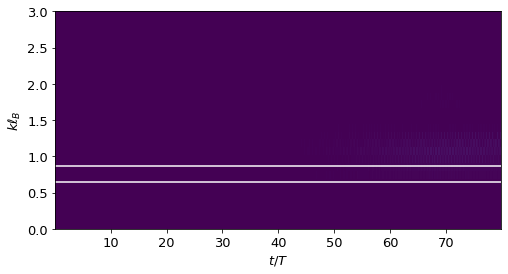

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


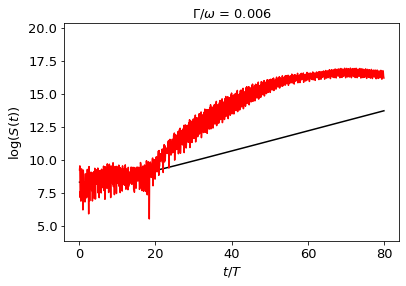

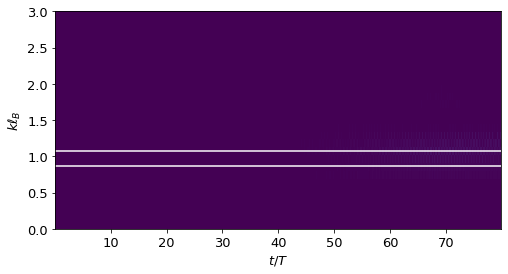

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


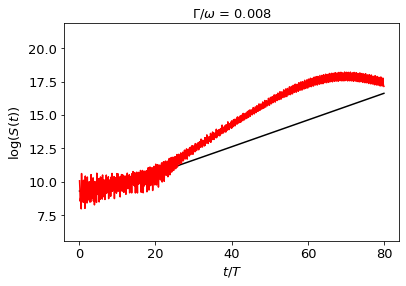

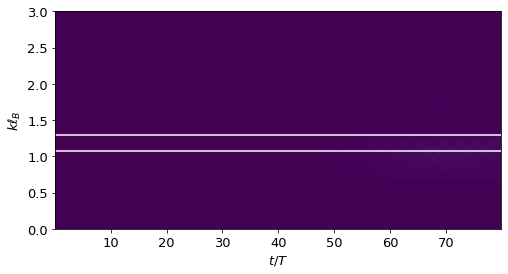

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


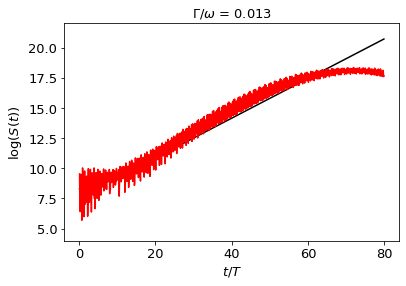

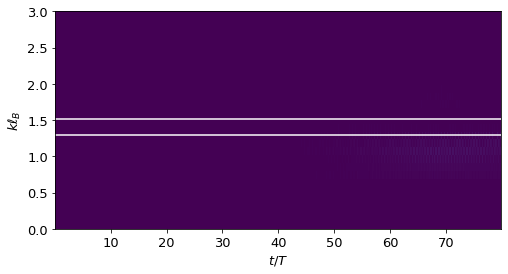

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


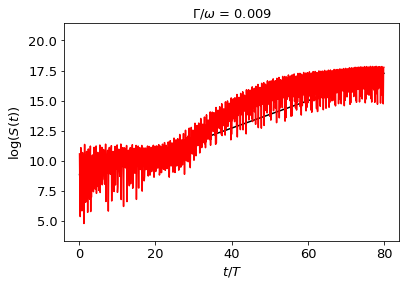

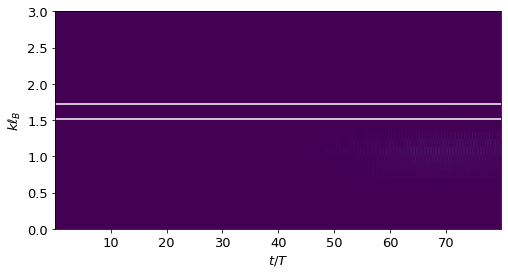

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


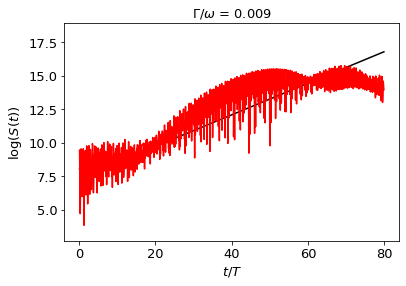

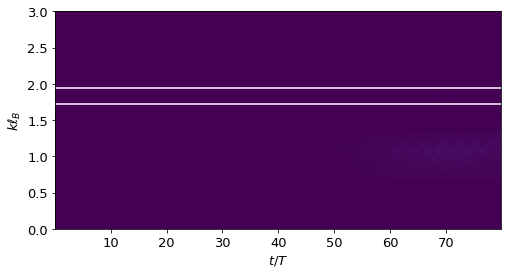

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


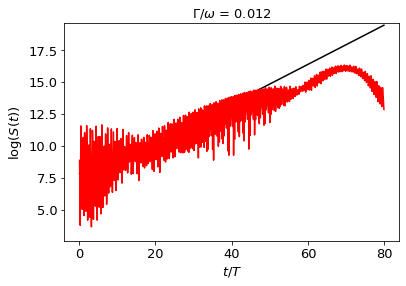

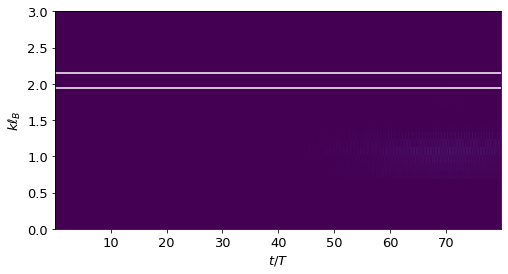

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


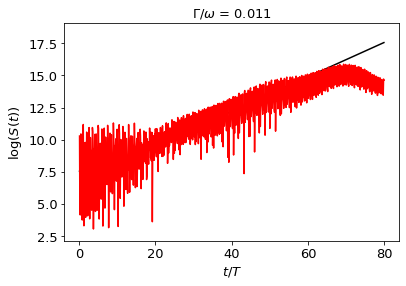

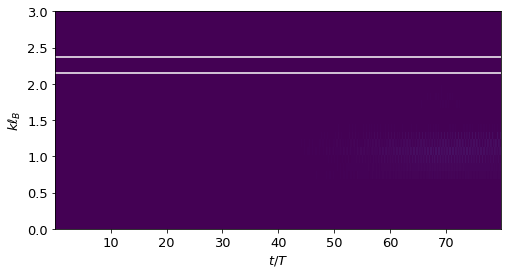

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


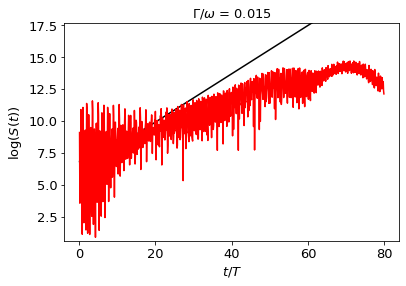

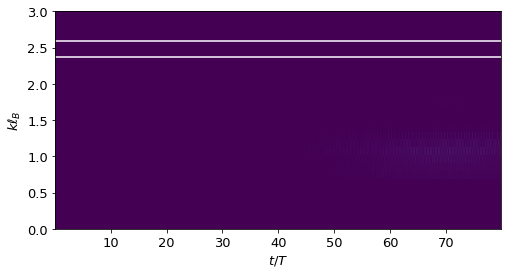

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


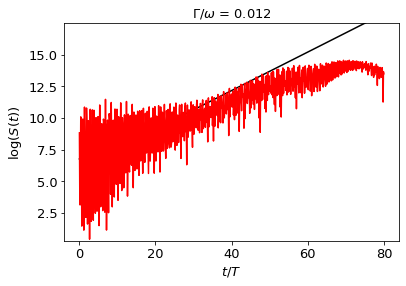

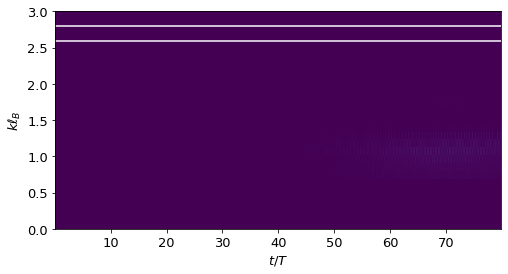

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


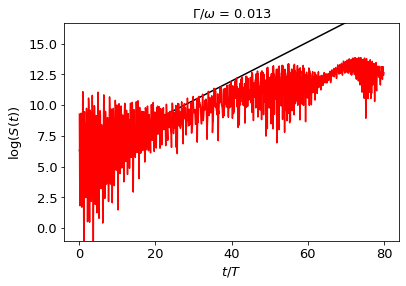

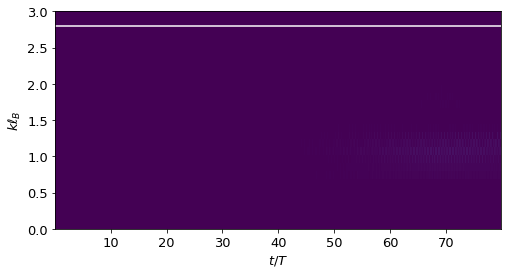

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


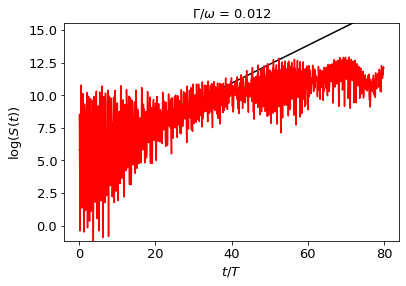

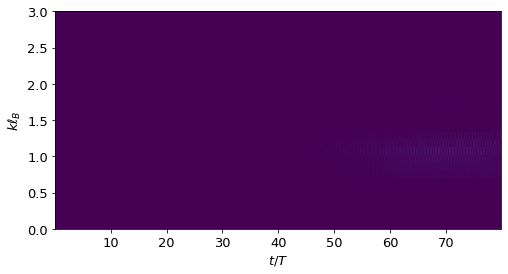

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':


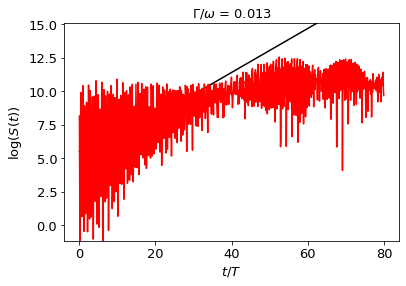

In [284]:
rates = []
raterrs = []
di=2

for i in range(0,30,di):
    
    plt.subplots(figsize=(8,4))
    plt.pcolormesh(times,klb,np.transpose(sks[1:]), shading='auto',  vmax=3e9)
    plt.ylim([0,3])
    plt.xlabel('$t/T$')
    plt.ylabel('$k\ell_B$')
    plt.axhline(klb[i],c='w')
    plt.axhline(klb[i+di],c='w')
    plt.show()
    
    growth = np.mean(np.array(sks)[1:,i:i+di], axis=1)
    xs = times
    ys = np.log(growth)
    
    guess= [1,200000]
    f,e = curve_fit(coshfunc, xs[:200], ys[:200], guess)
    plt.plot(xs, coshfunc(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit')
    
#     guess= [1,200000,5]
#     f,e = curve_fit(coshfuncsat, xs, ys, guess)
#     plt.plot(xs, coshfuncsat(xs,*f),'k', label='$\cosh(2\Gamma t)$ fit with saturation')
    
    plt.plot(xs,ys,'r', label='data')
    plt.ylim([0.7*np.min(ys),1.2*np.max(ys)])
    plt.ylabel('$\log(S(t))$')
    plt.title(f'$\Gamma/\omega$ = {f[0]/(2*np.pi):.3f}')
    plt.xlabel('$t/T$')
    
#     plt.show()
    
    rates.append(f[0]/(2*np.pi))
    raterrs.append(np.sqrt(np.diag(e))[0]/(2*np.pi))
    

In [259]:
def genarray(string):
    string = re.sub('{|}| ','',string)
    elements = re.split(',',string)
    enums = []
    for e in elements:
        if '*^' in e:
            es = re.split('\*\^',e)
            enums.append(np.float(es[0]) * (10**np.float(es[1])))
        else:
            enums.append(np.float(e))
    ks = enums[::2]
    es = enums[1::2]
    return np.vstack([ks,es])

df = pd.read_csv('data/bdg/bdgdata.dat', sep='\t', header=None, names=['gn','width','mu','rawesq'])

df['esq'] = None
df['eimag'] = None
for i,r in df.iterrows():
    esq = genarray(r.rawesq)
    df.at[i,'esq']= esq
    df.at[i,'eimag'] = np.vstack([esq[0],[np.sqrt(-e) if e<0 else np.nan for e in esq[1]]])

In [271]:
df.iloc[21]

gn                                                     3.91
width                                               1.48866
mu                                                  1.73518
rawesq    {{0., -2.929243842362673*^-9}, {0.006694964158...
esq       [[0.0, 0.006694964158471861, 0.013389928316943...
eimag     [[0.0, 0.006694964158471861, 0.013389928316943...
Name: 21, dtype: object

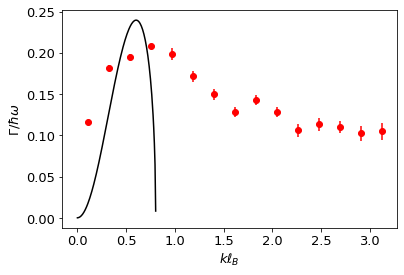

In [272]:
kxaxis = 0.5*(klb[np.arange(0,30,di)]+klb[np.arange(di,30+di,di)])
plt.errorbar(kxaxis,np.array(rates),yerr = raterrs,fmt='ro')

plt.plot(df.at[21,'eimag'][0],2*df.at[21,'eimag'][1],'k')

plt.ylabel('$\Gamma/\hbar\omega$')
plt.xlabel('$k\ell_B$')
plt.show()

# Data for ML

To run this section, reproduce the ground state and the hall strip from above. Use a 30000 ramp and a 10Hz trap

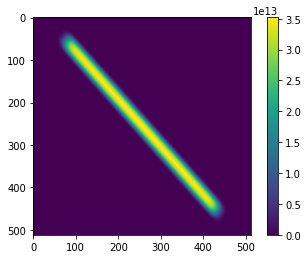

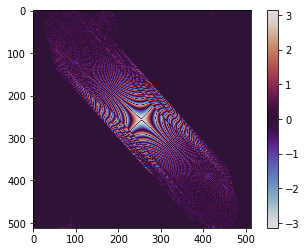

In [60]:
hallstrip.show_density()
hallstrip.show_phase()

In [61]:
# Set run parameters    
dt = 5e-5
noiseReps = 10
rotiniMLrun = pd.DataFrame()
rotiniMLrun['squeezeTime'] = [2000,3500, 5000,6500 ,8000, 10000,15000]
rotiniMLrun['runTime'] = [12000,14000, 15000 ,15000, 15000, 20000, 30000]

In [62]:
def runtimeFinder(runTime, numFrames, random=True):
    times = []
    basetime = runTime // numFrames
    times = [basetime] * numFrames
    if random: times = [t + int(np.random.normal(scale=basetime/10)) for t in times]
    return times


def noiseMaker(amp=0.15):
    noise = (0.j)*np.zeros((DIM,DIM))
    for i in range(DIM):
        for j in range(DIM):
            noise[i,j]= np.exp(amp * 1.j * 2*np.pi * (0.5-np.random.rand()))
    return noise


def compute_rotini_ML(startStrip, runTime=10000,
                   frames=7, noise=0.15, 
                   dsname='rotini', datafile='data/rotiniML.hdf5'):
    
    rotini = deepcopy(startStrip)
    rotini.env.harmonic_potential(omega=omega, epsilon=0.0)
    out = []
    out.append(rotini.Psi.copy())
    times = runtimeFinder(runTime, frames)
    
    for steps in tqdm(times, leave=False):
        rotini.env.rotating_frame(omegaR=[omega]*steps)
        rotini.evolve(steps=steps, cooling=0.0, dt=dt)
        out.append(rotini.Psi.copy())
                
    with h5py.File(datafile, 'a') as f:
        dset = f.create_dataset(dsname, data=np.array(out))
        dset.attrs['times'] = times
        dset.attrs['dt'] = dt

In [63]:
for i, r in tqdm(rotiniMLrun.iterrows(), leave=True):
    squeezeStrip = deepcopy(hallstrip)
    steps = r.squeezeTime
    squeezeStrip.env.rotating_frame(omegaR=omega*np.ones(steps))
    squeezeStrip.evolve(steps=steps, cooling=0.0, dt=2e-5) 
    
    for i in tqdm(range(noiseReps), leave=False):
        startStrip = deepcopy(squeezeStrip)
        startStrip.Psi *= noiseMaker()
        compute_rotini_ML(startStrip=startStrip, runTime=r.runTime, frames=10,
                          dsname=f'rotini_{steps}_{i}')
    

## rotate and clean

In [5]:

def clean_rotini(img):


In [149]:

viewx=356
viewy=356
with h5py.File('data/rotiniML.hdf5', 'r') as f:
    names = [name for name in f]
    print(names[20])
    dset = f[names[20]]
    clouds = dset[()]
#     for name in tqdm(f):
#         dset=f[name]
#         clouds = dset[()]
# #         clouds = [rotate_crop(a, viewx, viewy, 42) for a in dset[()]]
#         break

rotini_2000_0


In [150]:
rotini = clouds[8]

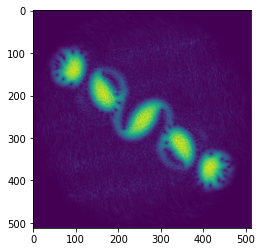

In [151]:
plt.imshow(np.abs(rotini))

In [161]:
def getimage(psi):
    psi = psi.copy()
    psi = psi[::2,::2]
    n = np.abs(psi)**2
    nimg = [255*n/n.max(),255*n/n.max(),255*n/n.max()]
    rg = np.array([np.real(psi), np.imag(psi),0*np.real(psi)])
    phiimg = 255*(rg+np.max(np.real(psi)))/(2.4*np.max(np.real(psi)))
    allimg = np.hstack([nimg,phiimg]).T
    return Image.fromarray(np.uint8(allimg))

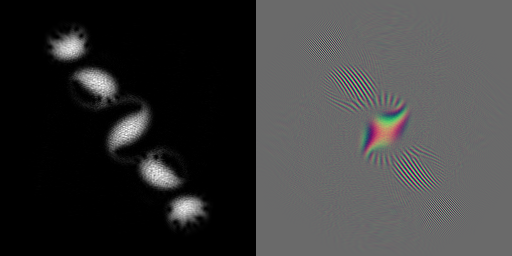

In [162]:
getimage(rotini* np.exp(13j * phase))
getimage(rotini)

In [105]:
with h5py.File('data/rotiniML.hdf5', 'r') as f:
#     names = [name for name in f]
#     print(names[20])
#     dset = f[names[20]]
    for name in tqdm(f):
        dset = f[name]
        for i in tqdm(range(len(dset)), leave=False):
            cloud = dset[i]
            im = getimage(cloud)
            im.save('data/rotiniML/'+name+str(i)+'.jpg')
    

        
            
        
        
    

In [128]:
imfake = Image.open('data/rotiniMLoutput/rotini_5000_30_fake_B.png')
imreal = Image.open('data/rotiniMLoutput/rotini_5000_30_real_B.png')
imn = Image.open('data/rotiniMLoutput/rotini_5000_30_real_A.png')

In [146]:
fakearray = np.array(imfake)
realarray = np.array(imreal)

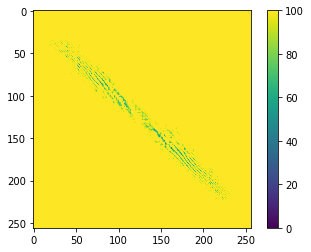

In [145]:
plt.imshow(fakearray[:,:,2], vmax=100, vmin=0)
plt.colorbar()

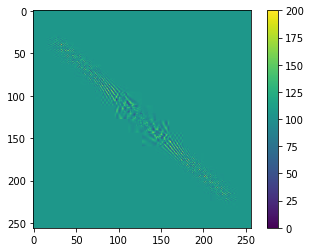

In [148]:
plt.imshow(realarray[:,:,2], vmax=200, vmin=0)
plt.colorbar()

In [153]:
imtest = getimage(rotini)

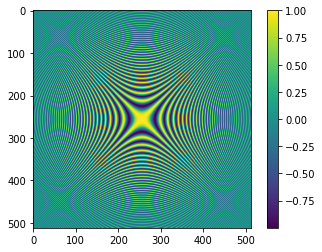

In [19]:
x = np.linspace(-5,5,DIM)
xx, yy = np.meshgrid(x, x)
 
# phase = xx * yy
phase = (xx + yy)*(xx- yy)
# phase = np.arctan(yy/xx)

plt.imshow(np.exp(9j * phase).real)
plt.colorbar()

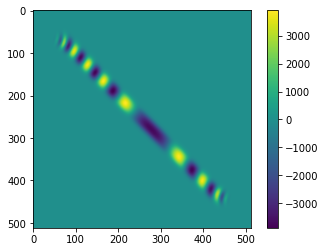

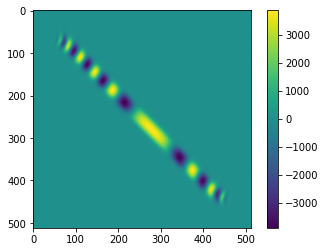

In [21]:
test= rotini.Psi * np.exp(14j * phase)
plt.figure()
plt.imshow(test.real)
plt.colorbar()
test2= rotini.Psi * np.exp(14j * phase) * np.exp(0j*phase + 3j)
plt.figure()
plt.imshow(test2.real)
plt.colorbar()

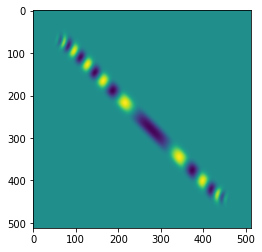

In [22]:
plt.imshow(test.real - test2.real)

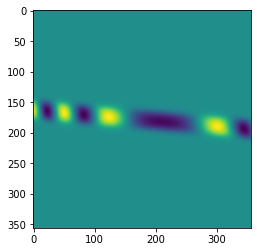

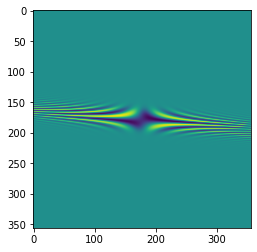

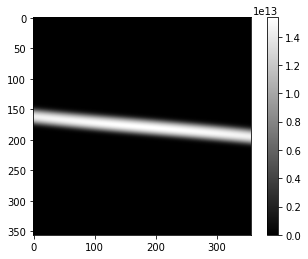

In [23]:
plt.imshow(rotate_crop(test.real, viewx=356, viewy=356, angle=40))
plt.show()
plt.imshow(rotate_crop(rotini.Psi.real, viewx=356, viewy=356, angle=40))
plt.show()
plt.imshow(rotate_crop(rotini.density, viewx=356, viewy=356, angle=40), cmap='gist_gray')
plt.colorbar()

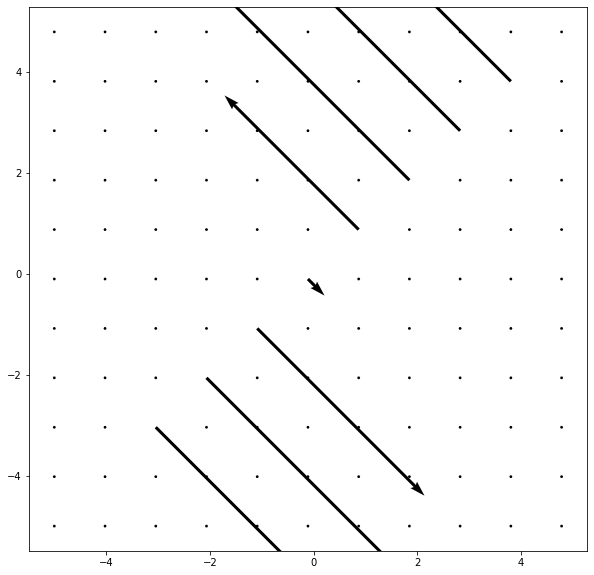

In [63]:
vx, vy = np.gradient(phase*(np.abs(test)>5e2))
skip=50
plt.figure(figsize=(10,10))
plt.quiver(xx[::skip,::skip],yy[::skip,::skip],vx[::skip,::skip],vy[::skip,::skip])

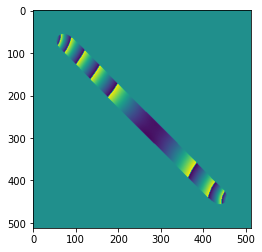

In [25]:
plt.imshow(np.angle(test)* (np.abs(test)>5e2))

In [42]:
alal = [np.linalg.norm([vxx,vyy]) for (vxx,vyy) in zip(vx.flatten(), vy.flatten())]

In [46]:
alal= (vy-vy2).flatten()

(0.0, 1000.0)

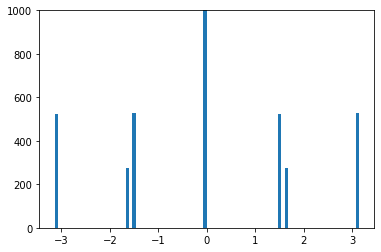

In [47]:
plt.hist(alal, bins=90)
plt.ylim([0,1000])

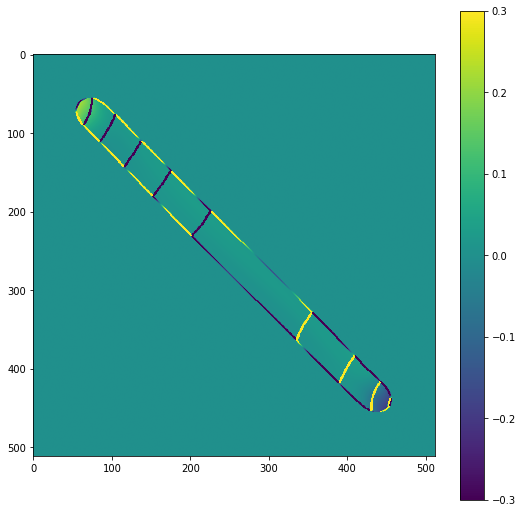

In [65]:
plt.figure(figsize=(9,9))
plt.imshow(vy-vy2, vmin=-.3,vmax=.3)
plt.colorbar()

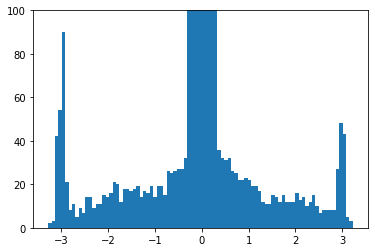

In [69]:
plt.hist((vx-vx2).flatten(), bins=90)
plt.ylim([0,100])
plt.show()

In [ ]:
vx2, vy2 = np.gradient(np.angle(test2)*(np.abs(test2)>5e2))

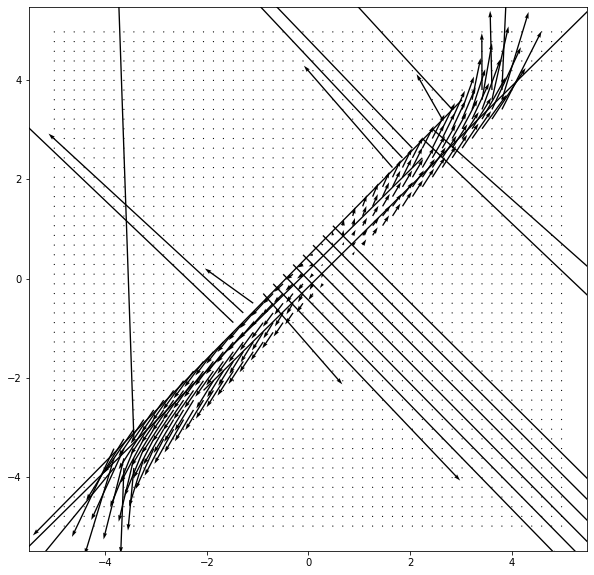

In [59]:
vx, vy = np.gradient(np.angle(test)*(np.abs(test)>5e2))
skip=10
plt.figure(figsize=(10,10))
plt.quiver(xx[::skip,::skip],yy[::skip,::skip],vx[::skip,::skip],vy[::skip,::skip])

# 1064 Large

In [67]:
omega   = 2*np.pi*30
dx = fov/DIM
dx = 350e-6/512
window = 400
x  = dx * (np.arange(window) - window//2)
dk = 1/(window * dx)
k = dk * np.arange(window)
mass = 3.8e-26
lb = np.sqrt(hbar / (2*mass *omega))
klb = lb * k * (2*np.pi)

In [68]:
lb

2.7073056639728345e-06

In [63]:
dx

6.8359375e-07

In [64]:
lb/dx

3.9604014284402607

In [69]:
1.7*4.6 / 2.7

2.896296296296296

In [35]:
omega   = 2*np.pi*10
epsilon = 0.2
dt = 1e-5
fov = 500e-6
DIM=1064

e = Environment(DIM=DIM, fov=fov, N=1e7)
e.harmonic_potential(omega=omega, epsilon=epsilon)

groundstate = Wavefunction(e)
groundstate.initialize_Psi(width=10)
groundstate.relax(vmax=1e9, dt=2*dt, steps=4000)

groundstate.evolve(dt=dt, cooling=0.01, steps=4000)




            Running condensate on 1064x1064 grid with:
            atom number: 1e+07 
            mass:        3.80e-26
        


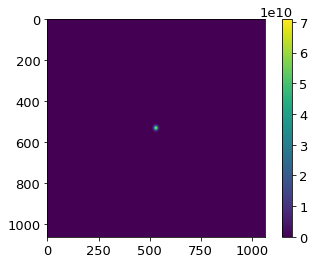

10.0


In [23]:
groundstate.show_density()
print(np.round(np.sum(groundstate.density) * ((fov/DIM)**2)))

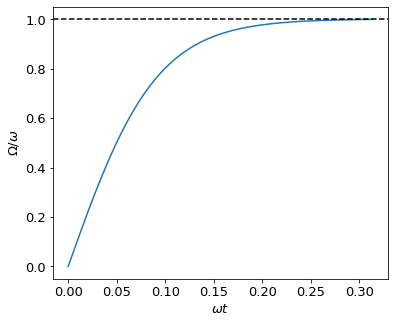

In [26]:
def rotation_freq_simple(timestep, whirrTime=30000, whirrMax=omega):
    tanh =  omega * 1.002 * np.tanh(3.46 * timestep / whirrTime)
    return np.min([whirrMax,tanh])

whirrMax = omega
steps = 500
whirrtime = 500
times = np.arange(steps)
Omega = [rotation_freq_simple(t, whirrTime=whirrtime) for t in times]

plt.figure(figsize=(6,5))
plt.plot(omega*dt*times, np.array(Omega)/omega)
plt.axhline(Omega[-1]/omega,ls='--',c='k')
plt.xlabel(r'$\omega t$')
plt.ylabel(r'$\Omega/\omega$')
plt.show()

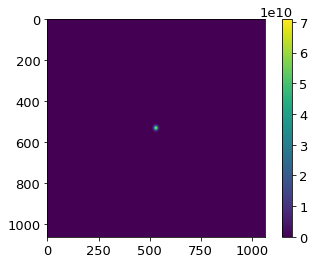

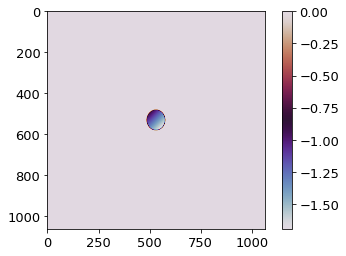

In [27]:
# Run the sim - takes longer than the 10Hz sim above
hallstrip = deepcopy(groundstate)
hallenv = hallstrip.env
hallenv.rotating_frame(omegaR=Omega)
hallenv.absorbing_boundaries(strength=1, radius=e.fov/2)

hallstrip.evolve(dt=dt, steps=steps, cooling=0)
hallstrip.show_density()
hallstrip.show_phase()

In [ ]:
startstrip = deepcopy(hallstrip)

In [33]:
steps=10000
startstrip.env.rotating_frame(omegaR=omega*np.ones(steps))
# startstrip.env.harmonic_potential(omega=omega, epsilon=0.05)
startstrip.evolve(steps=steps, cooling=0.0, dt=6e-5)

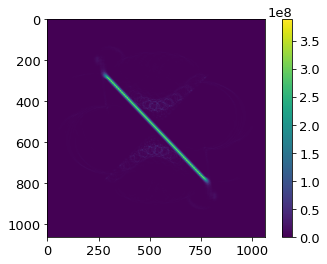

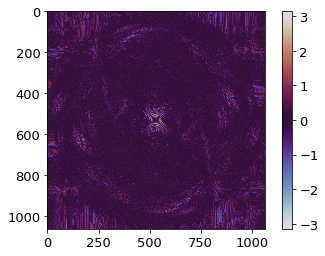

In [36]:

startstrip.show_density()
startstrip.show_phase()

## Crop and find the angle to the diagonal after the ramp

In [10]:
width = 512//2
plotrange=140
ncrop = finalstrip.density[(width-plotrange):(width+plotrange),(width-plotrange):(width+plotrange)]

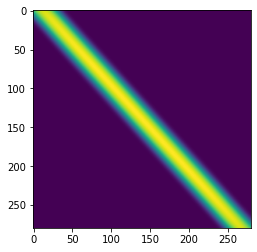

In [13]:
plt.imshow(ncrop)

In [20]:
xsize = len(ncrop)
xx = np.linspace(-10, 10, xsize)
yy = np.linspace(-10, 10, xsize)
xx, yy = np.meshgrid(xx, yy)

# Calculate the moment of inertia tensor
Ixx = np.sum(ncrop*yy*yy)
Iyy = np.sum(ncrop*xx*xx)
Ixy = np.sum(ncrop*xx*yy)
Iyx = Ixy
I =np.array( [[Ixx, Ixy], [Iyx, Iyy]])
evals, evecs = np.linalg.eig(I)
iangle = (180*np.arctan(evecs[np.argmin(evals)][1]/evecs[np.argmin(evals)][0])/np.pi)


In [21]:
print(f"angle from diagonal equipotential: {(iangle-45):.2f} degrees")

angle from diagonal equipotential: 2.47 degrees


# Noise at specific k

In [210]:
psik.shape

(512, 512)

In [518]:
# Defines

omega = 2*np.pi*10
fov = 350e-6
DIM = 512
dx = fov/DIM
window = 512
dk = 1/(window * dx)
k = dk * np.arange(window//2)
mass = 3.8e-26
lb = np.sqrt(hbar / (2*mass *omega))
klb = lb * k * (2*np.pi)

def targetfilter(array, radius, thickness, factor=1, dcwidth=10):
    l = len(array)//2
    x,y = np.mgrid[-l:l,-l:l]
    r = np.sqrt(x**2 + y**2)
    mask = 0 * x
    mask[r<dcwidth] = 1
    mask[ (r<(radius+thickness/2)) *  (r>(radius-thickness/2))] = factor
    return mask * array


def momentumspace(psi, plot='2D', N=1e6, title=None):
    psik = np.fft.fftshift(np.fft.fft2(psi, norm='ortho'))
    sk = np.abs(psik)**2 / N
    skravg = azimuthalAverage(sk)
    if plot=='2D':
        plt.imshow(sk, vmax=3, cmap='inferno')
        plt.colorbar()
        plt.show()
    elif plot=='2Dravg':
        f,axarr = plt.subplots(ncols=2, figsize=(11,5))
        im = axarr[0].imshow(sk,vmax=3, cmap='inferno')
#         f.colorbar(im, ax=axarr[0])
        axarr[1].plot(klb,skravg)
        plt.gca().set(ylabel='S(k)', xlabel='$k\ell_B$', ylim=[0,8])
        plt.tight_layout()
        plt.show()
        
    elif plot=='2Dall':
        
        f,axarr = plt.subplots(ncols=2, figsize=(11,5))
        im = axarr[0].imshow(np.abs(psi)**2,cmap='viridis')
        im = axarr[1].imshow(sk,vmax=2, cmap='inferno')
#         f.colorbar(im, ax=axarr[0])
        plt.title(title)
        plt.tight_layout()
        plt.show()
        
    return psik
              
    
def azimuthalAverage(image, center=None):
    """
    Calculate the azimuthally averaged radial profile.
    image - The 2D image
    center - The [x,y] pixel coordinates used as the center. The default is 
             None, which then uses the center of the image (including 
             fracitonal pixels).
    
    """
    # Calculate the indices from the image
    y, x = np.indices(image.shape)

    if not center:
        center = np.array([(x.max()-x.min())/2.0, (y.max()-y.min())/2.0])

    r = np.hypot(x - center[0], y - center[1])

    # Get sorted radii
    ind = np.argsort(r.flat)
    r_sorted = r.flat[ind]
    i_sorted = image.flat[ind]

    # Get the integer part of the radii (bin size = 1)
    r_int = r_sorted.astype(int)

    # Find all pixels that fall within each radial bin.
    deltar = r_int[1:] - r_int[:-1]  # Assumes all radii represented
    rind = np.where(deltar)[0]       # location of changed radius
    nr = rind[1:] - rind[:-1]        # number of radius bin
    
    # Cumulative sum to figure out sums for each radius bin
    csim = np.cumsum(i_sorted, dtype=float)
    tbin = csim[rind[1:]] - csim[rind[:-1]]

    radial_prof = tbin / nr

    return radial_prof[:image.shape[0]//2]

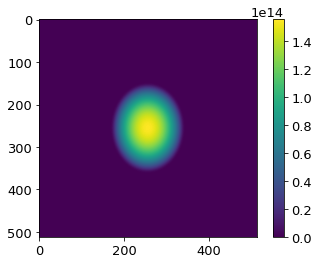

In [358]:
noisygroundstate = deepcopy(groundstate)
noisygroundstate.show_density()

In [360]:
noise = (0.j)*np.zeros((DIM,DIM))
for i in range(DIM):
    for j in range(DIM):
        noise[i,j]= np.exp(0.15 * 1.j * 2*np.pi * (0.5-np.random.rand()))

noisygroundstate.Psi *= noise

In [374]:
noisygroundstate.evolve(steps=1000, vmax=2e8, dt=1e-5, cooling=0.0)

## load

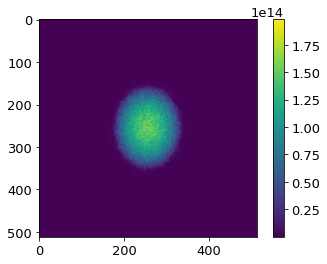

In [408]:
with open('data/noisygroundstate512.p', 'rb') as f:
    noisygroundstate = pickle.load(f)
noisygroundstate.show_density()

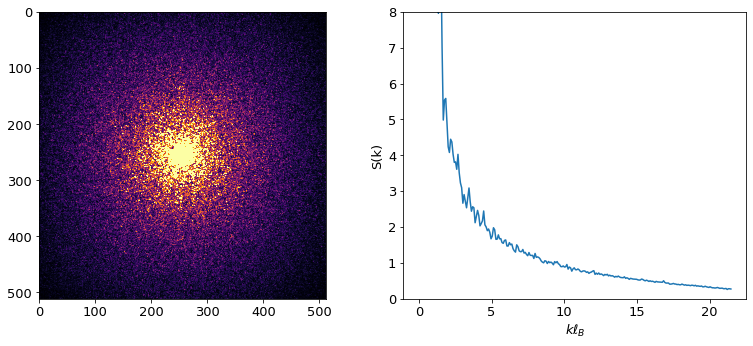

In [409]:
psik = momentumspace(noisygroundstate.Psi, plot='2Dravg')

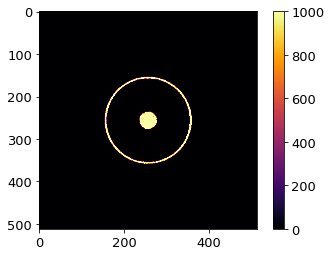

In [443]:
psifilterk = targetfilter(psik, radius=100, thickness=3, dcwidth=20, factor=5)
plt.imshow(np.abs(psifilterk), vmax=1e3, cmap='inferno')
plt.colorbar()

In [444]:
psifilter = np.fft.fft2(np.fft.ifftshift(psifilterk), norm='ortho')

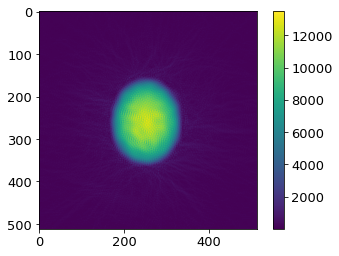

In [445]:
plt.imshow(np.abs(psifilter))
plt.colorbar()

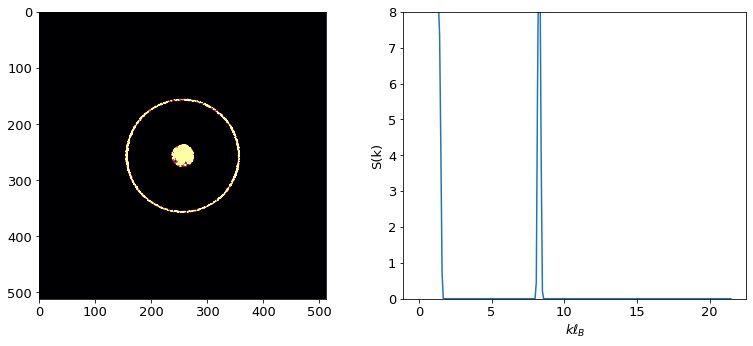

In [446]:
_=momentumspace(psifilter, plot='2Dravg')

In [493]:
filteredgroundstate = deepcopy(noisygroundstate)
filteredgroundstate.Psi = np.ascontiguousarray(psifilter)

In [494]:
filteredgroundstate.evolve(steps=1000, vmax=2e8, dt=1e-5, cooling=0.0)

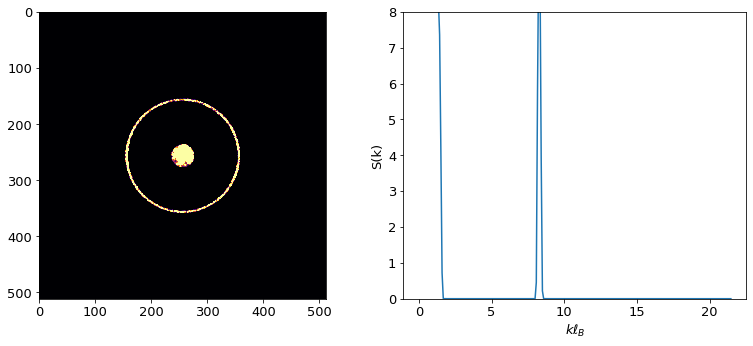

In [495]:
psik = momentumspace(filteredgroundstate.Psi, plot='2Dravg')

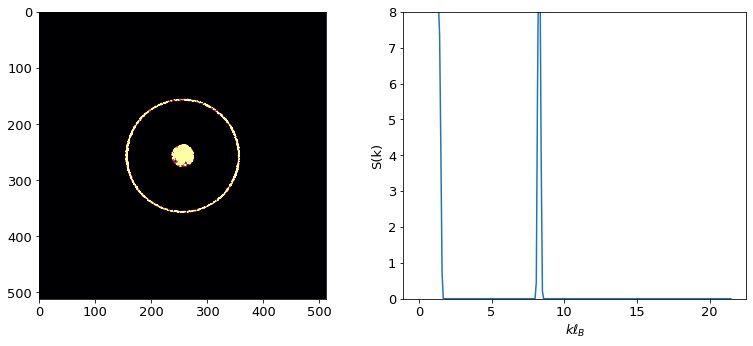

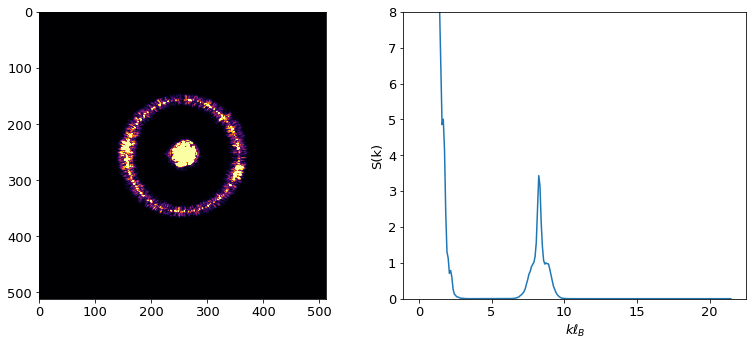

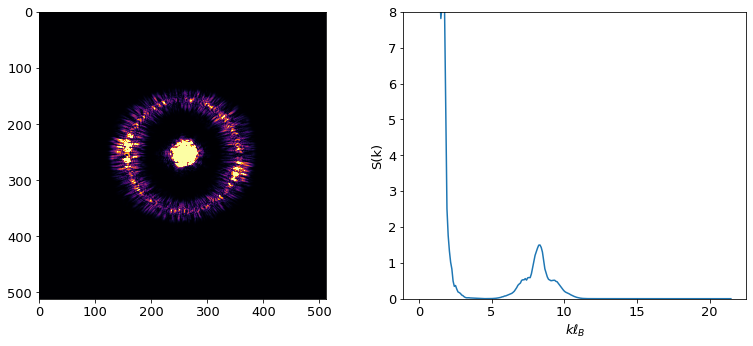

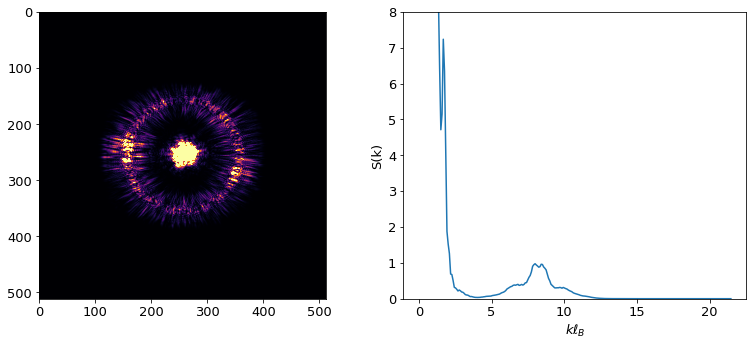

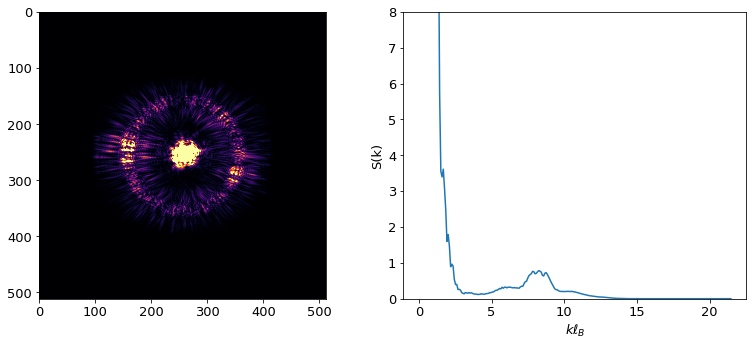

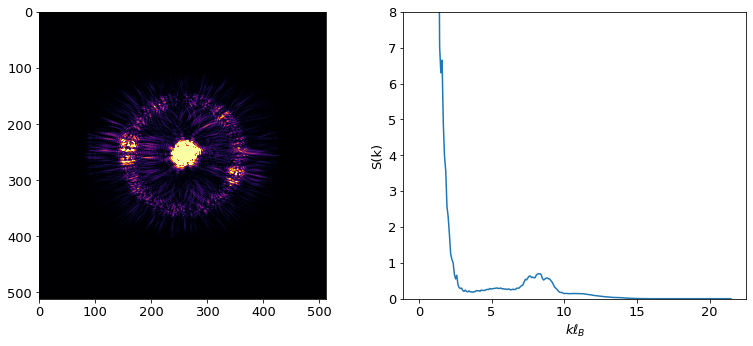

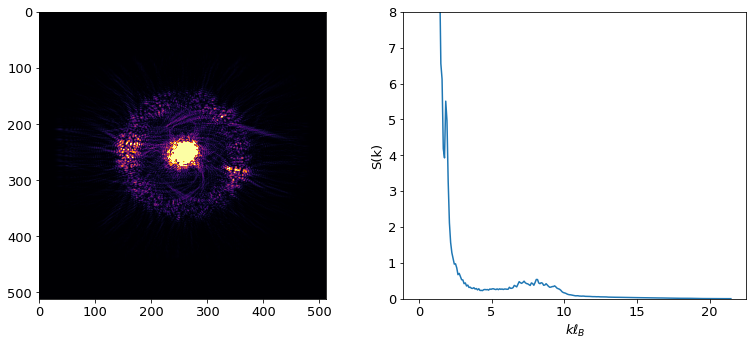

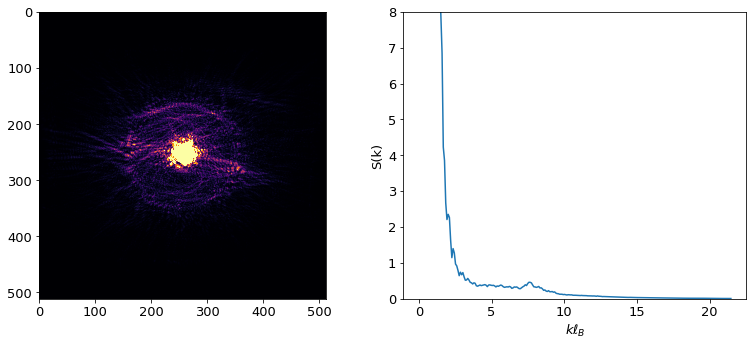

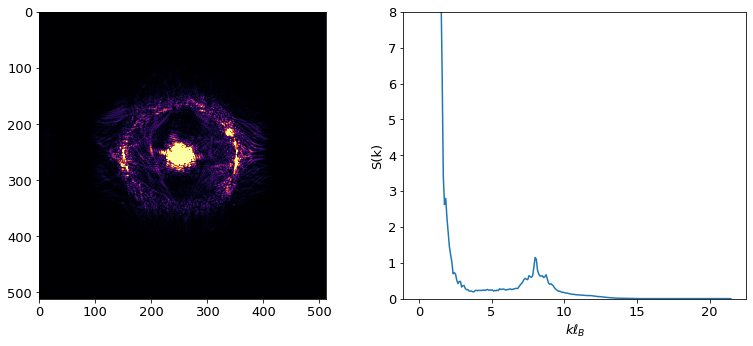

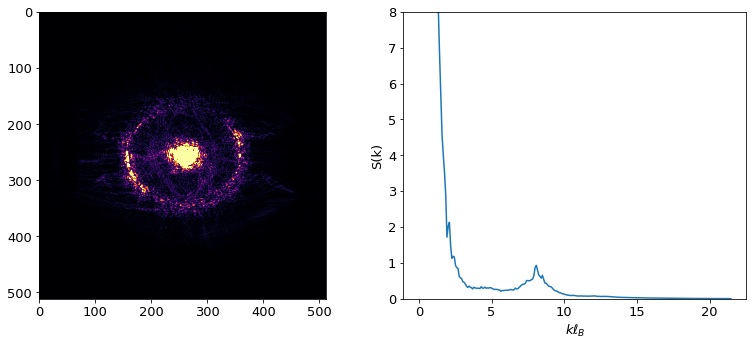

In [469]:
filteredgroundstate = deepcopy(noisygroundstate)
filteredgroundstate.Psi = np.ascontiguousarray(psifilter)
psik = momentumspace(filteredgroundstate.Psi, plot='2Dravg')
sk = np.abs(psik)**2 / 1e6
skravg = azimuthalAverage(sk)
sks = [skravg]
steplist = [0,100,200,300,400,500,1000,2000,5000,10000]

for i in tqdm(range(len(steplist)-1)):
    filteredgroundstate.evolve(steps=(steplist[i+1] - steplist[i]), vmax=2e8, dt=1e-5, cooling=0.0)
    psik = momentumspace(filteredgroundstate.Psi.copy(), plot='2Dravg')
    sk = np.abs(psik)**2 / 1e6
    skravg = azimuthalAverage(sk)
    sks.append(skravg)


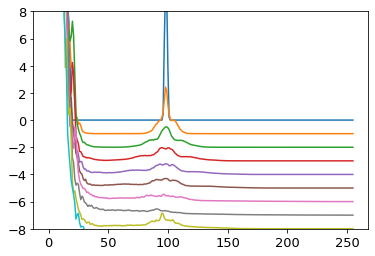

In [477]:
for i in range(len(sks)):
    plt.plot(sks[i]-i)
    plt.ylim([-8,8])

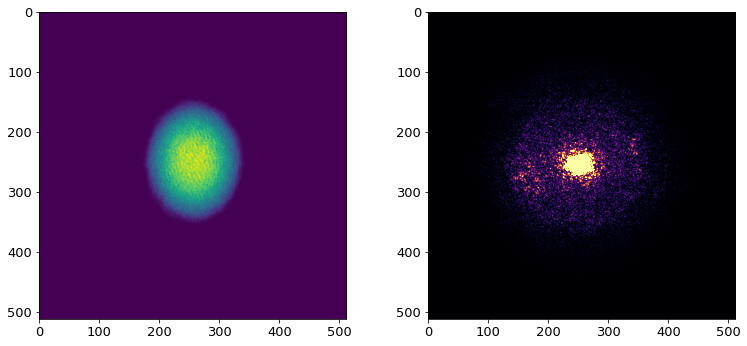

In [482]:
_ = momentumspace(filteredgroundstate.Psi, plot='2Dall')

In [ ]:
filteredgroundstate = deepcopy(noisygroundstate)
filteredgroundstate.Psi = np.ascontiguousarray(psifilter)
psik = momentumspace(filteredgroundstate.Psi, plot='2Dravg')
sk = np.abs(psik)**2 / 1e6
skravg = azimuthalAverage(sk)
sks = [skravg]
steplist = [0,100,200,300,400,500,1000,2000,5000,10000]

for i in tqdm(range(len(steplist)-1)):
    filteredgroundstate.evolve(steps=(steplist[i+1] - steplist[i]), vmax=2e8, dt=1e-5, cooling=0.0)
    psik = momentumspace(filteredgroundstate.Psi.copy(), plot='2Dravg')
    sk = np.abs(psik)**2 / 1e6
    skravg = azimuthalAverage(sk)
    sks.append(skravg)

## spinup

In [485]:
steps

50000

In [519]:
hallstrip = deepcopy(filteredgroundstate)
hallenv = hallstrip.env
hallenv.absorbing_boundaries(strength=1, radius=1*e.fov/2)

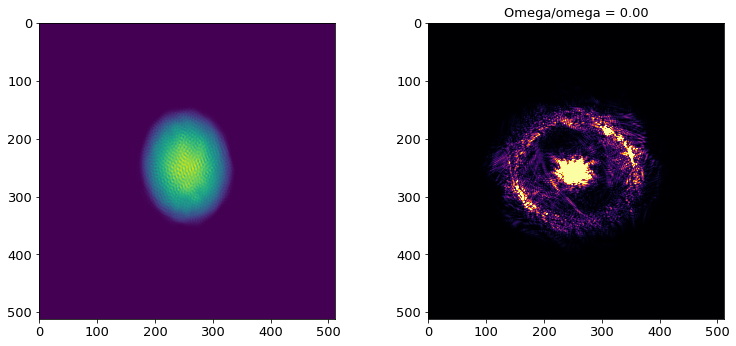

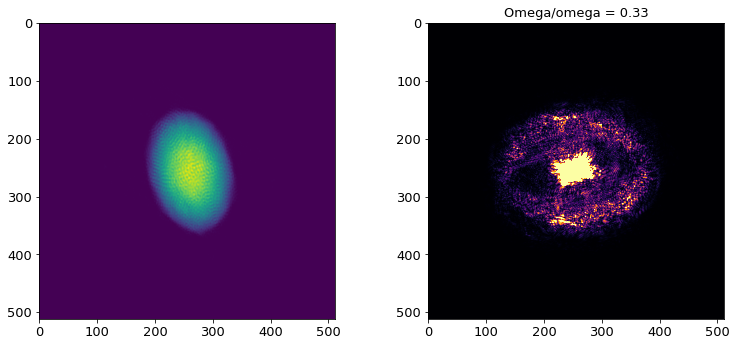

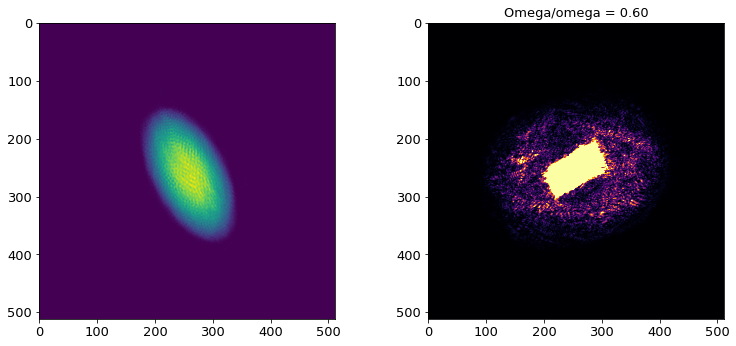

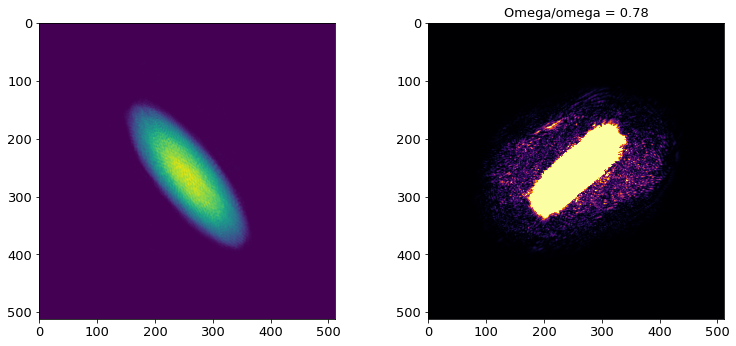

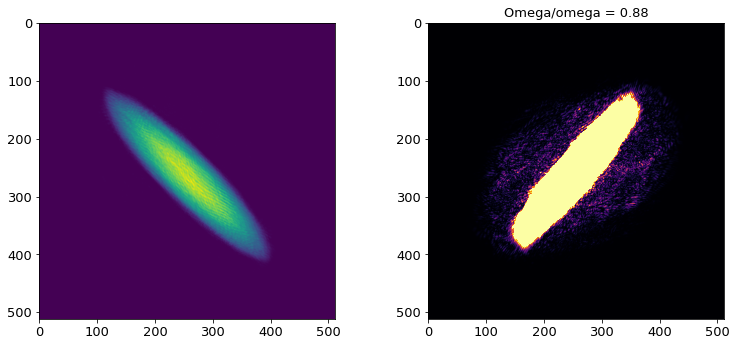

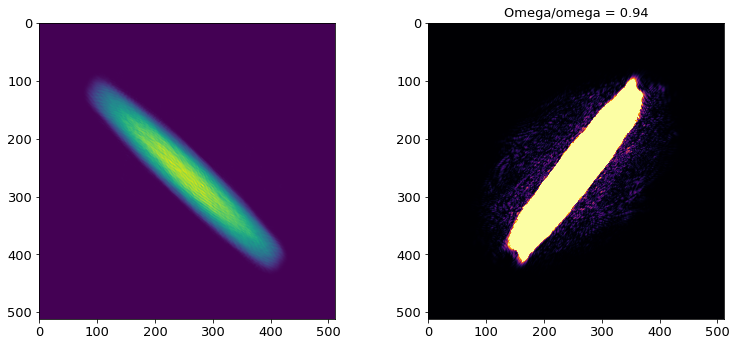

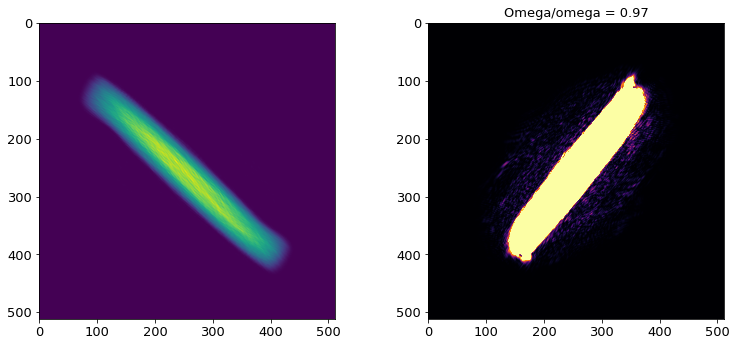

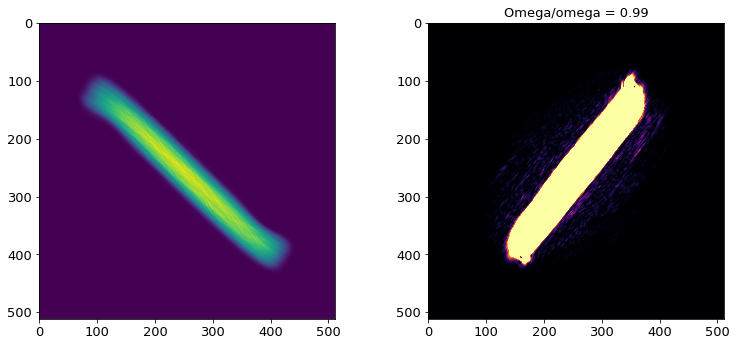

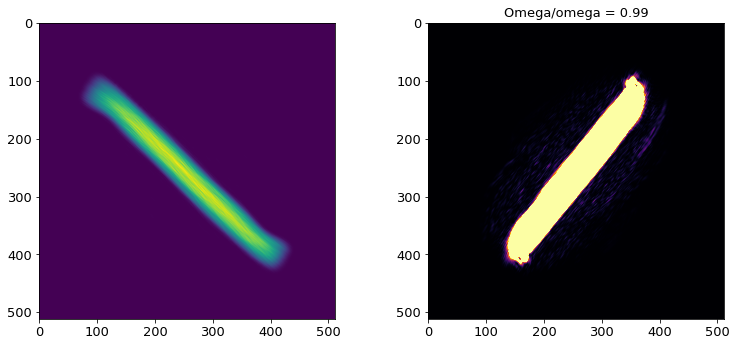

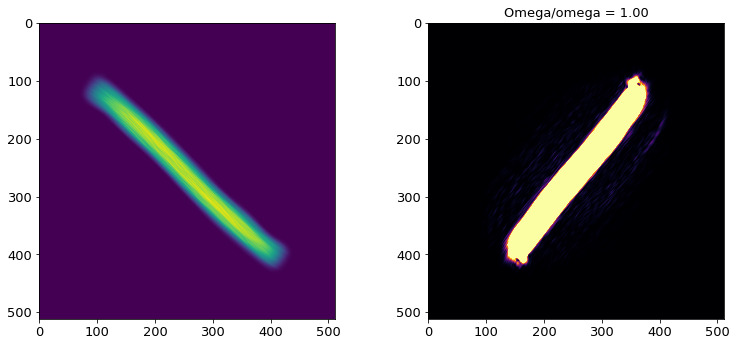

In [520]:
frames = 10
runtime = steps//frames
for i in range(frames):    
    hallenv.rotating_frame(omegaR=Omega[i*runtime: (i+1) * runtime])
    hallstrip.evolve(dt=dt, steps=runtime, cooling=0.0, showevery=50)
    _ = momentumspace(hallstrip.Psi, plot='2Dall', title=f"Omega/omega = {Omega[i*runtime]/omega:2.2f}")